## Mass continuity

In [1]:
# %matplotlib notebook

In [2]:
import os
import pandas as pd
import numpy as np # for array (matrix) operations
import shapely.geometry; import shapely # for vector feature operations
import rasterio; import rasterio.mask # for raster analysis
import fiona
import cmocean
import matplotlib.pyplot as plt # plotting

In [3]:
#set basepath containing your velocity data
basepath = '/Users/jukesliu/Documents/TURNER/DATA/VELOCITY_MAPS/output_autoRIFT/'

### Load velocity map(s)

In [39]:
# grab the velocity filenames from the basepath
for file in os.listdir(basepath):
    if file.startswith('velocity') and file.endswith('200m_S2.tif'):
        if '20150522'in file and '20150531' in file: # start and end date
            print(file)
            filename = file

            # open the rasters using rasterio
            VFILE = rasterio.open(basepath+file, 'r')
            VX = VFILE.read(1)
            VY = VFILE.read(2)
            vmag = VFILE.read(3)
            
            # dsiplay to check
            fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(15,6))
            ax1.imshow(VX, cmap=cmocean.cm.thermal); ax1.set_title('VX', fontsize=14)
            ax2.imshow(VY, cmap=cmocean.cm.thermal); ax2.set_title('VY', fontsize=14)
            ax3.imshow(vmag, cmap=cmocean.cm.thermal); ax3.set_title('V', fontsize=14)
            plt.show()

In [31]:
# grab velocity map bounds
list(VFILE.bounds)
VFILE.bounds

BoundingBox(left=546087.127, bottom=6641492.3027, right=587487.127, top=6682892.3027)

### Load glacier data and spatial reference

In [32]:
glacier_name = 'SitKusa'; glacier_abbrev = 'SK'

# coordinates with the same CRS and units of the velocity map:
# glacier_coords = [-3.95e5, -1.46e6, -3.7e5, -1.48e6] #[upperleftX, Y,lowerright X, Y]
glacier_coords = [VFILE.bounds.left, VFILE.bounds.top, VFILE.bounds.right, VFILE.bounds.bottom] # use map bounds
print(glacier_coords)
zoom_coords = [572899, 6656000, 574220, 6657000] #[upperleftX, Y,lowerright X, Y]
print(zoom_coords)
print(glacier_name)

[546087.127, 6682892.3027, 587487.127, 6641492.3027]
[572899, 6656000, 574220, 6657000]
SitKusa


/var/folders/mr/7f69f7y50zj85n420pyvh8cr0000gq/T/ipykernel_67426/2761203883.py:4: FionaDeprecationWarning: Collection.__next__() is buggy and will be removed in Fiona 2.0. Switch to `next(iter(collection))`.
  glacier = f.next()
ERROR 1: PROJ: proj_identify: Cannot find proj.db


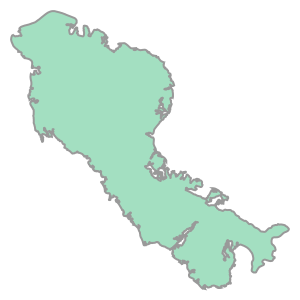

In [7]:
# load a shapefile with the same CRS as the velocity maps as a shapely polygon
shp_path = '/Users/jukesliu/Documents/TURNER/DATA/shapefiles_gis/Turner_RGI/glims_download_27048/'
f = fiona.open(shp_path+'TG_glims_polygon_UTM7.shp') # read in the shapefile with fiona
glacier = f.next()
glacierpolygon = shapely.geometry.Polygon(glacier['geometry']['coordinates'][0]) # turn into shapely polygon
glacierpolygon

In [8]:
# SHIFTER:
# grab cell resolution - should be 250.0 m
cellres = VFILE.transform[0]; print("Cell resolution in m:", cellres)
#if the coords correspond to the middle of a cell, shift the coordinates inwards
for coords in [glacier_coords, zoom_coords]: #do for glacier coords and zoom coords
    offset_X = (VFILE.bounds[0] - coords[0])/cellres
    offset_Y = (VFILE.bounds[1] - coords[1])/cellres
    if int(offset_X) - offset_X  != 0: #if offset_X is not a whole number:
        #shift left glacier_coord inwards by half a cell by adding cellres/2
        coords[0] = coords[0]+(cellres/2)
        #shift right glacier_coord inwards by subtracting cellres/2
        coords[2] = coords[2]-(cellres/2)
        print("Shifted x_coords inwards.")
    if int(offset_Y) - offset_Y  != 0: #if offset_Y is not a whole number:
        #shift top glacier_coord inwards by subtracting half a cell
        coords[1] = coords[1]-(cellres/2)
        #shift bottom glacier_coord inwards by subtracting cellres/2
        coords[3] = coords[3]+(cellres/2)
        print("Shifted y_coords inwards.")


Cell resolution in m: 200.0
Shifted x_coords inwards.
Shifted y_coords inwards.


In [9]:
# use the upperleft and lower right coordinates to generate 4 box coordinates:
subset_coords4 = [(glacier_coords[0], glacier_coords[1]), (glacier_coords[2], glacier_coords[1]), 
                  (glacier_coords[2], glacier_coords[3]), (glacier_coords[0], glacier_coords[3])]
# use the upperleft and lower right coordinates to generate 4 zoom coordinates:
zoom_coords4 = [(zoom_coords[0], zoom_coords[1]), (zoom_coords[2], zoom_coords[1]), 
                  (zoom_coords[2], zoom_coords[3]), (zoom_coords[0], zoom_coords[3])]
# make shapely polygons with the glacier_coords and zoom_coords to crop your velocity data to
subset = shapely.geometry.Polygon(subset_coords4)
zoom = shapely.geometry.Polygon(zoom_coords4)
print(subset.bounds); print(zoom.bounds) #print the bounding coordinates

(546087.127, 6641492.3027, 587687.127, 6682892.3027)
(572999.0, 6655900.0, 574120.0, 6657100.0)


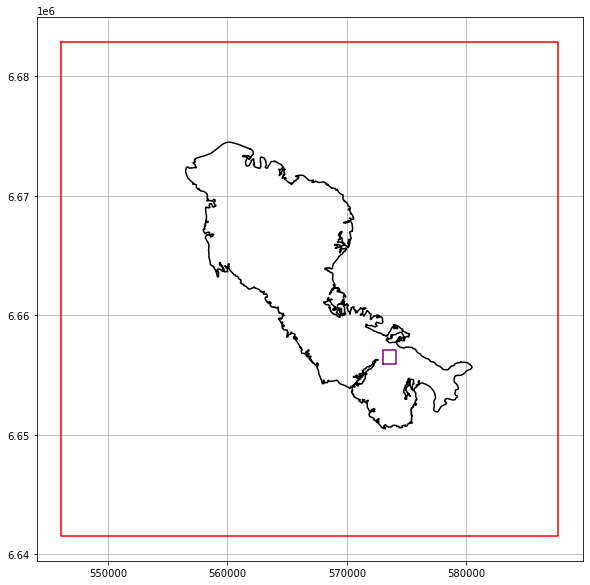

In [10]:
# show your subset shape: should be a rectangle
plt.figure(figsize=(10,10))
x1,y1 = subset.exterior.xy; plt.plot(x1,y1, 'r'); plt.grid() # red subset area
# show your zoom shape: should be a much smaller rectangle
x2,y2 = zoom.exterior.xy; plt.plot(x2,y2,'purple'); # purple zoomed region
x3,y3 = glacierpolygon.exterior.xy; plt.plot(x3,y3,'k') # black glacier outline
plt.gca().set_aspect('equal', adjustable='box')
plt.show()

## 1) Subset velocity data within your set bounds

In [33]:
# Subset the velocity data using rasterio.mask.mask and subset polygon (must be in a [list] due to syntax of mask)
subsetVFILE, transform1 = rasterio.mask.mask(VFILE, [subset], crop=True) 
subsetVX_2D = subsetVFILE[0,:,:]
subsetVY_2D = subsetVFILE[1,:,:]

#CALCULATE FLOW DIRECTION AND SPEED
Vdir = np.arctan2(subsetVY_2D, subsetVX_2D) #flow direction calculated using numpy's arctan2(y, x)
Vdir_deg = Vdir*180/np.pi #converted to degrees
V = np.sqrt(np.square(subsetVY_2D)+np.square(subsetVX_2D)) #calculate magnitude using the sqrt of the sum of square X and Y values

#if magnitude is unrealistic, replace value with np.NaN value
V[V > 2.5e9] = np.NaN; Vdir[V > 2.5e9] = np.NaN

In [34]:
#grab x coordinate and y coordinate limits:
print(subset.bounds)
#create vector of x coordinates and y coordinates (Greenland Polar Stereo) with the dimensions of the image
#for plotting ticks
Nticks = 3
x_coords = np.linspace(subset.bounds[0], subset.bounds[2], num=Nticks, dtype=int); #print(x_coords)
y_coords = np.linspace(np.max([subset.bounds[1], subset.bounds[3]]), np.min([subset.bounds[1], subset.bounds[3]]), num=Nticks, dtype=int)

(546087.127, 6641492.3027, 587687.127, 6682892.3027)


#### Plot flow speed and direction:

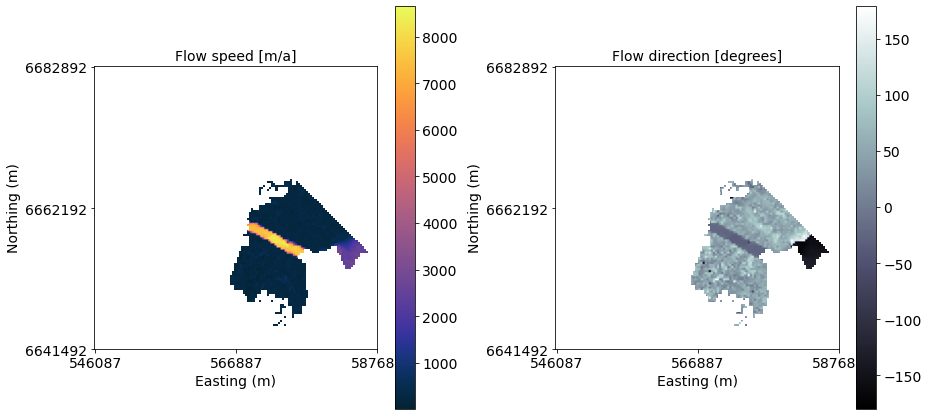

In [35]:
#set plot variables (speed & flow direction) and color schemes
tfs=14; lfs =14; #set tick and label fontsizes for all plots
variables1 = [V, Vdir_deg]
cols = [cmocean.cm.thermal, 'bone']

#plot them as subplots
fig, axs = plt.subplots(1,2,figsize=(13,6))
ax1,ax2 = axs
im1 = ax1.imshow(variables1[0], cmap=cols[0]); plt.gca().set_aspect('equal', adjustable='box')
im2 = ax2.imshow(variables1[1], cmap=cols[1]); plt.gca().set_aspect('equal', adjustable='box')

# common plotting parameters
for ax in axs:
    ax.set_xticks(np.linspace(0, subsetVX_2D.shape[1], Nticks));
    ax.set_yticks(np.linspace(0, subsetVX_2D.shape[0], Nticks));
    ax.set_xticklabels(x_coords, fontsize=tfs); ax.set_yticklabels(y_coords, fontsize=tfs)
    ax.set_xlabel('Easting (m)', fontsize=lfs); ax.set_ylabel('Northing (m)', fontsize=lfs)

# colorbar and titles
cbar = plt.colorbar(im1, ax=ax1); cbar.ax.tick_params(labelsize=lfs)
cbar = plt.colorbar(im2, ax=ax2); cbar.ax.tick_params(labelsize=lfs)
ax1.set_title('Flow speed [m/a]',fontsize=lfs)
ax2.set_title('Flow direction [degrees]',fontsize=lfs)
plt.tight_layout(h_pad=2); plt.show()


## 2) Calculate strain rates and assuming mass continuity, dw/dz

The numpy __gradient__ function will calculate gradients in velocity across each grid cell in both the x and y directions. We need to rotate the grid into flow-following coordinates to analyze strain rates.

In [36]:
# Calculate velocity gradients

#set grid spacing y, which should be 250.0 m (print to check)
dx = cellres; dy=cellres; print(dx, dy)
#Calculate gradients in velocity (ORDER OF OUTPUTS SWITCHED FROM MATLAB)
[Exy,EXX] = np.gradient(subsetVX_2D, dx); #gradients in x-component of velocity
[EYY,Eyx] = np.gradient(subsetVY_2D, -dy); #gradients in y-component of velocity
#NUMPY CALCULATES Exy and Eyx with opposite signs, so make
#consistent with MATLAB example:
Exy = -Exy; Eyx = -Eyx
EXY = 0.5*(Exy+Eyx); # calculate shear strain rates

200.0 200.0


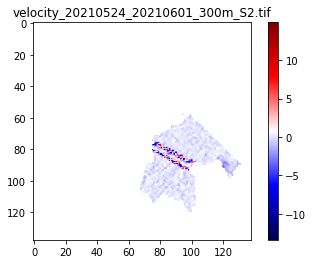

In [37]:
# Calculate dw/dz using mass continuity
[dudy,dudx] = np.gradient(subsetVX_2D, dx); #gradients in x-component of velocity
[dvdy,dvdx] = np.gradient(subsetVY_2D, -dy); #gradients in y-component of velocity
dwdz = 0 - dudx - dvdy

plt.figure()
plt.imshow(dwdz, cmap='seismic')
plt.title(filename)
plt.colorbar()
plt.show()

# Run on all velocity maps throughout SK's surge cycle:

In [16]:
# grab velocity map bounds for all
list(VFILE.bounds)
VFILE.bounds

glacier_name = 'SitKusa'; glacier_abbrev = 'SK'

glacier_coords = [VFILE.bounds.left, VFILE.bounds.top, VFILE.bounds.right, VFILE.bounds.bottom] # use map bounds
print(glacier_coords)
zoom_coords = [572899, 6656000, 574220, 6657000] #[upperleftX, Y,lowerright X, Y]
print(zoom_coords)
print(glacier_name)

# SHIFTER:
# grab cell resolution - should be 250.0 m
cellres = VFILE.transform[0]; print("Cell resolution in m:", cellres)
#if the coords correspond to the middle of a cell, shift the coordinates inwards
for coords in [glacier_coords, zoom_coords]: #do for glacier coords and zoom coords
    offset_X = (VFILE.bounds[0] - coords[0])/cellres
    offset_Y = (VFILE.bounds[1] - coords[1])/cellres
    if int(offset_X) - offset_X  != 0: #if offset_X is not a whole number:
        #shift left glacier_coord inwards by half a cell by adding cellres/2
        coords[0] = coords[0]+(cellres/2)
        #shift right glacier_coord inwards by subtracting cellres/2
        coords[2] = coords[2]-(cellres/2)
        print("Shifted x_coords inwards.")
    if int(offset_Y) - offset_Y  != 0: #if offset_Y is not a whole number:
        #shift top glacier_coord inwards by subtracting half a cell
        coords[1] = coords[1]-(cellres/2)
        #shift bottom glacier_coord inwards by subtracting cellres/2
        coords[3] = coords[3]+(cellres/2)
        print("Shifted y_coords inwards.")

# use the upperleft and lower right coordinates to generate 4 box coordinates:
subset_coords4 = [(glacier_coords[0], glacier_coords[1]), (glacier_coords[2], glacier_coords[1]), 
                  (glacier_coords[2], glacier_coords[3]), (glacier_coords[0], glacier_coords[3])]
# use the upperleft and lower right coordinates to generate 4 zoom coordinates:
zoom_coords4 = [(zoom_coords[0], zoom_coords[1]), (zoom_coords[2], zoom_coords[1]), 
                  (zoom_coords[2], zoom_coords[3]), (zoom_coords[0], zoom_coords[3])]
# make shapely polygons with the glacier_coords and zoom_coords to crop your velocity data to
subset = shapely.geometry.Polygon(subset_coords4)
zoom = shapely.geometry.Polygon(zoom_coords4)
print(subset.bounds); print(zoom.bounds) #print the bounding coordinates

[546087.127, 6682892.3027, 587687.127, 6641492.3027]
[572899, 6656000, 574220, 6657000]
SitKusa
Cell resolution in m: 200.0
Shifted x_coords inwards.
Shifted y_coords inwards.
(546087.127, 6641492.3027, 587687.127, 6682892.3027)
(572999.0, 6655900.0, 574120.0, 6657100.0)


In [17]:
# grab final velocity filenames
vmap_names = os.listdir('/Users/jukesliu/Documents/TURNER/DATA/VELOCITY_MAPS/custom_autoRIFT_cline_data/filtered-north/')
vmap_names

['20190630_20190705_S2_300m.csv',
 '20200115_20200127_S1_120m.csv',
 '20170423_20170506_S2_100m.csv',
 '20220412_20220415_S2_200m.csv',
 '20210402_20210415_S2_160m.csv',
 '20180210_20180217_S2_300m.csv',
 '20170915_20170927_S1_120m.csv',
 '20200401_20200410_LS_200m.csv',
 '20210415_20210422_S2_300m.csv',
 '20180705_20180720_S2_300m.csv',
 '20190610_20190620_S2_300m.csv',
 '20180618_20180630_S1_120m.csv',
 '20140325_20140401_LS_200m.csv',
 '20200505_20200510_S2_300m.csv',
 '20210619_20210701_S2_300m.csv',
 '20181227_20190108_S1_120m.csv',
 '20191003_20191008_S2_160m.csv',
 '20200904_20200914_S2_160m.csv',
 '20190222_20190225_S2_300m.csv',
 '20220611_20220616_S2_200m.csv',
 '20220415_20220419_S2_100m.csv',
 '20180128_20180202_S2_300m.csv',
 '20190118_20190131_S2_100m.csv',
 '20130414_20130610_LS_200m.csv',
 '20210719_20210729_S2_300m.csv',
 '.DS_Store',
 '20170220_20170317_LS_200m.csv',
 '20180416_20180506_S2_160m.csv',
 '20220419_20220430_S2_100m.csv',
 '20170602_20170705_S2_200m.csv',


velocity_20210815_20210830_300m_S2.tif


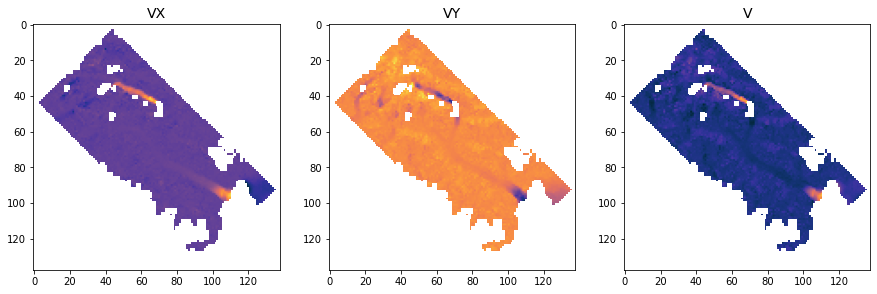

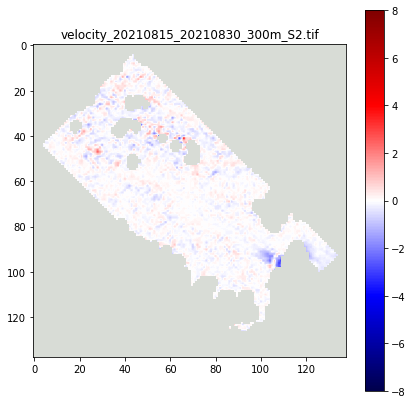

velocity_20220409_20220412_100m_S2.tif


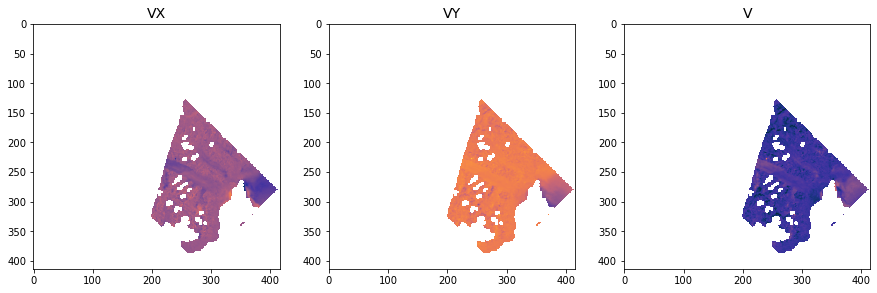

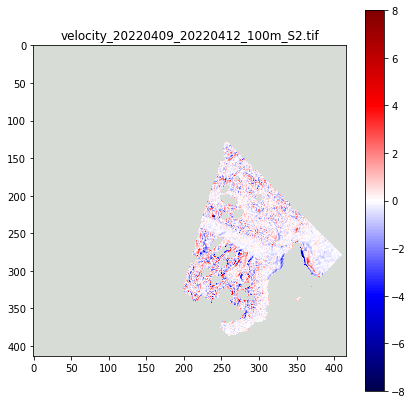

velocity_20171109_20171114_300m_S2.tif


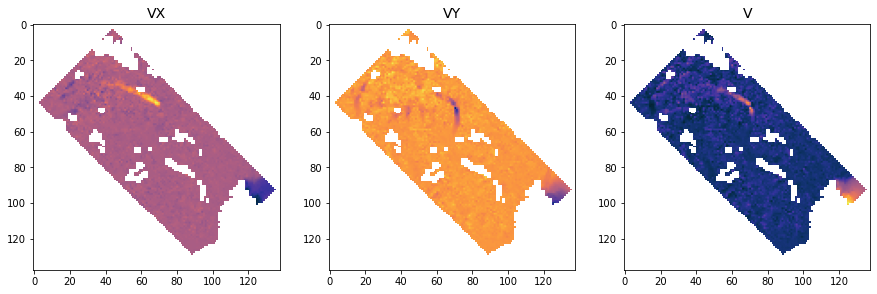

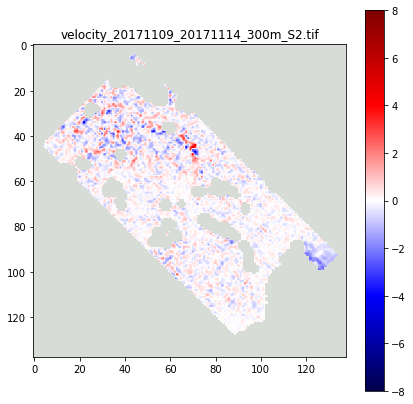

velocity_20220326_20220331_300m_S2.tif


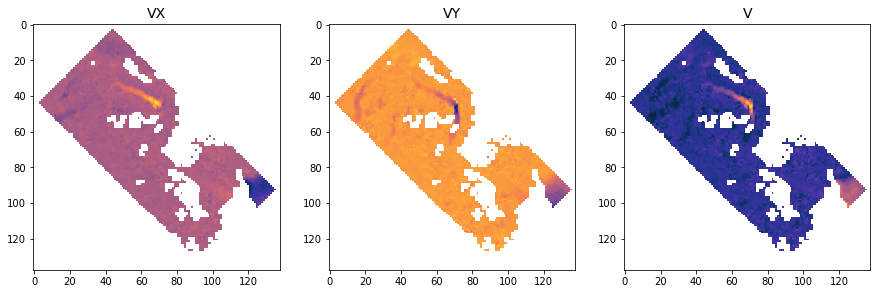

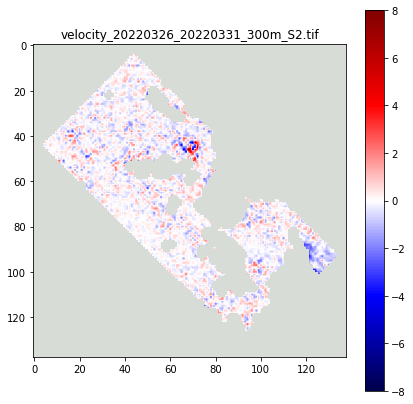

velocity_20150522_20150531_200m_LS.tif


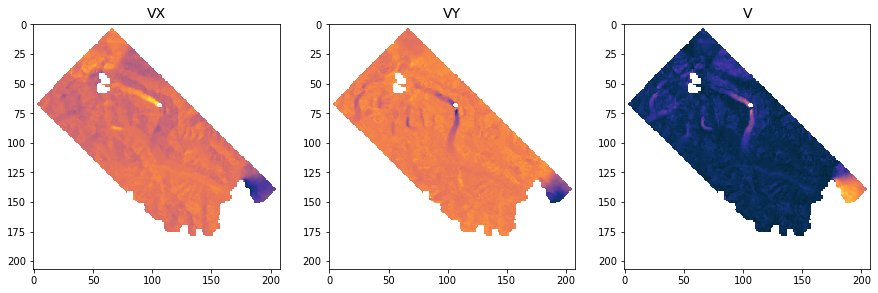

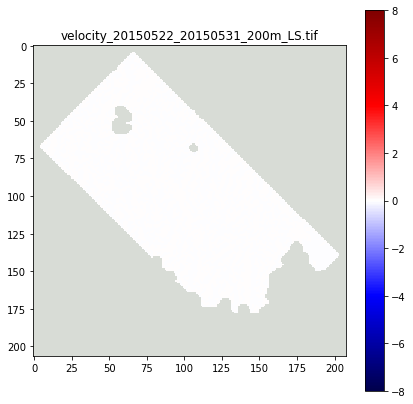

velocity_20190722_20190730_100m_S2.tif


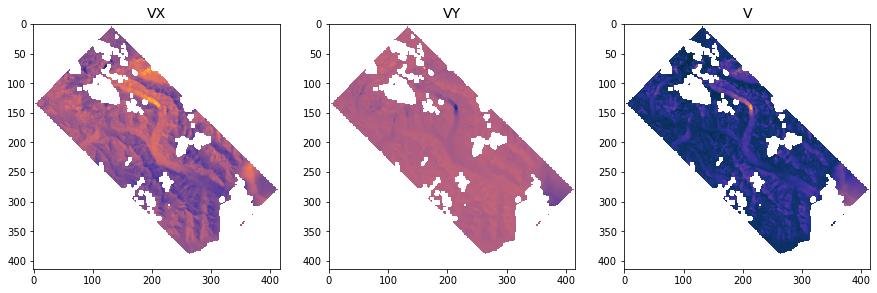

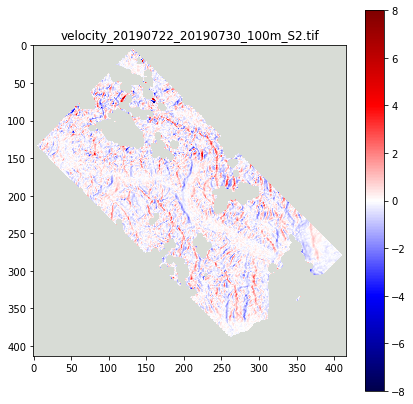

velocity_20210719_20210729_300m_S2.tif


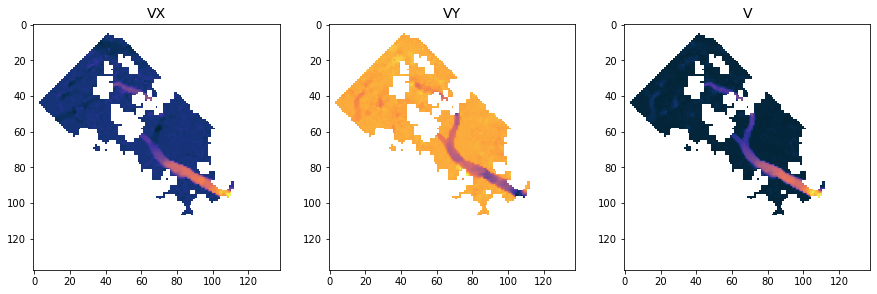

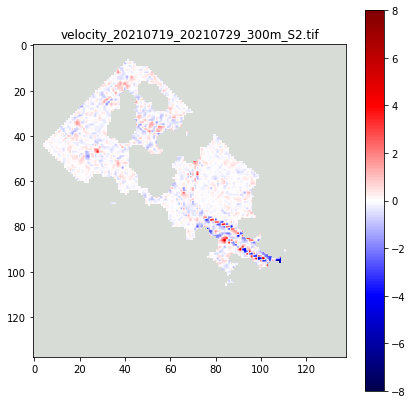

velocity_20200425_20200502_100m_S2.tif


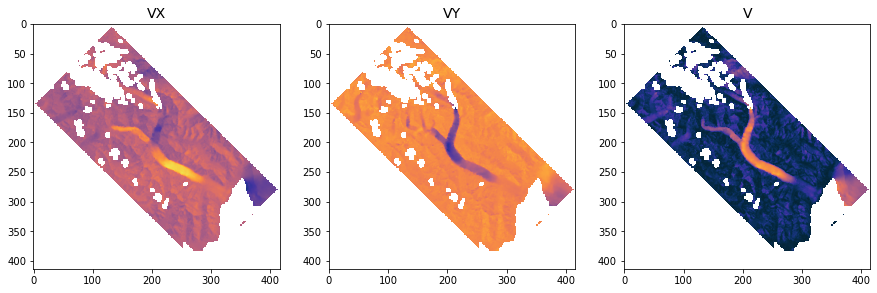

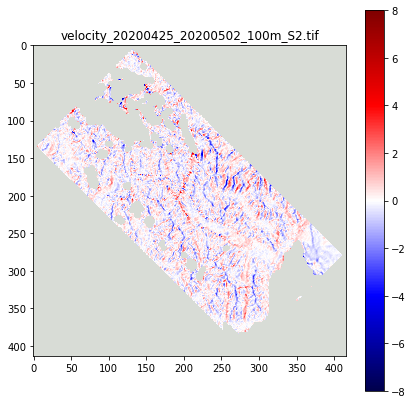

velocity_20180128_20180202_300m_S2.tif


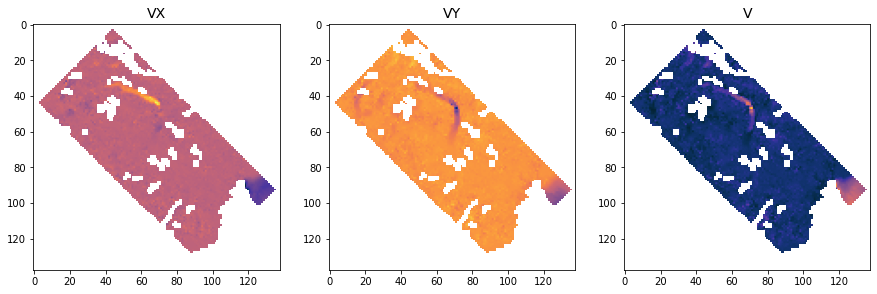

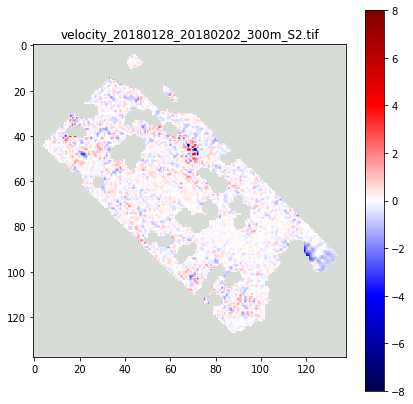

velocity_20140401_20140410_200m_LS.tif


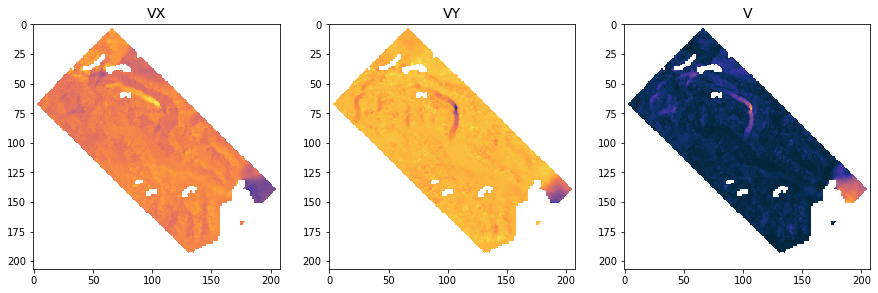

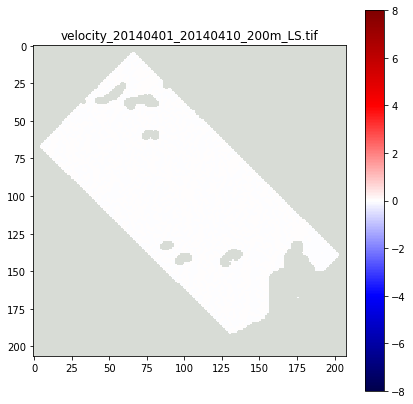

velocity_20190222_20190225_300m_S2.tif


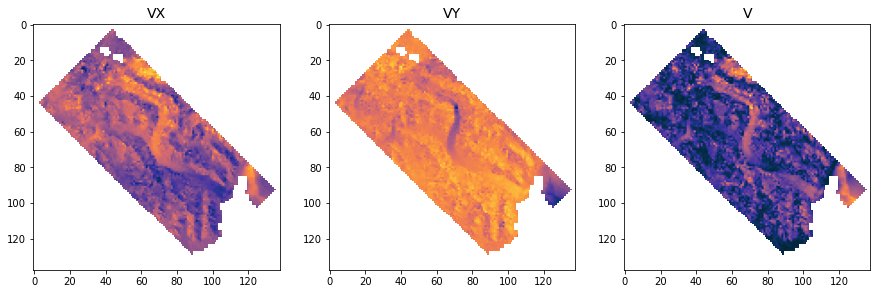

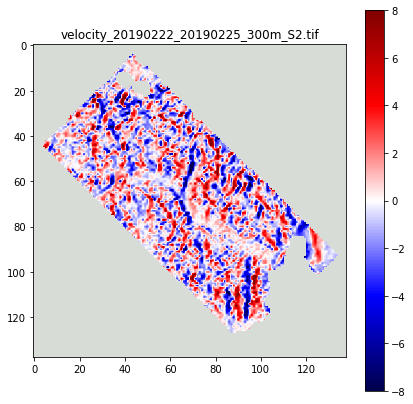

velocity_20130813_20131007_200m_LS.tif


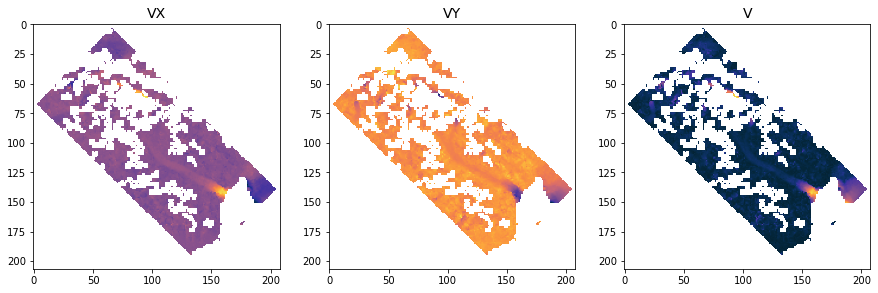

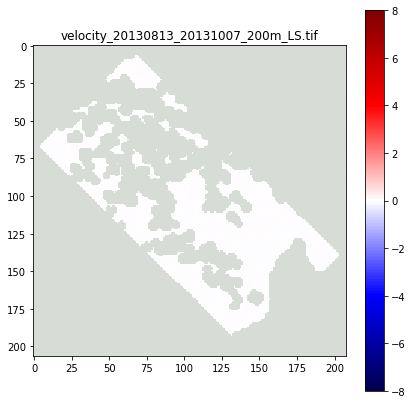

velocity_20190610_20190620_300m_S2.tif


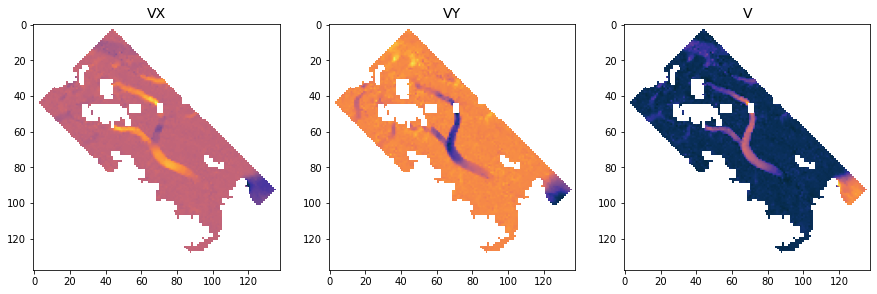

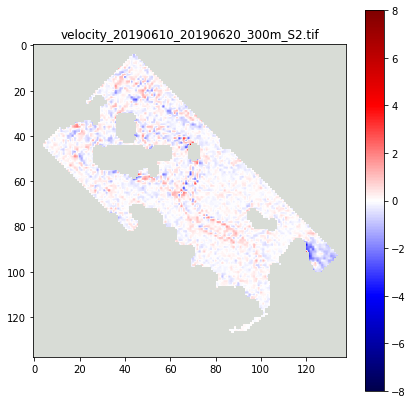

velocity_20200505_20200510_300m_S2.tif


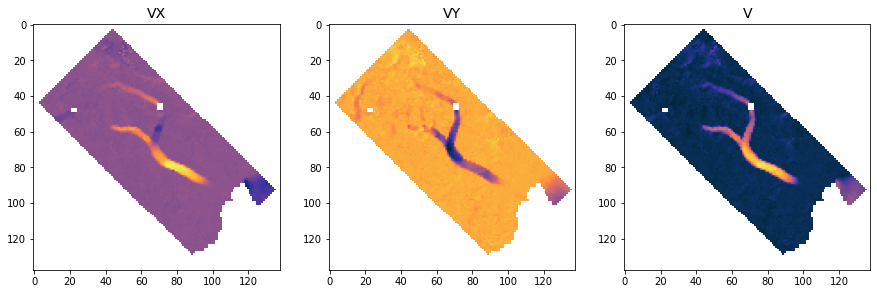

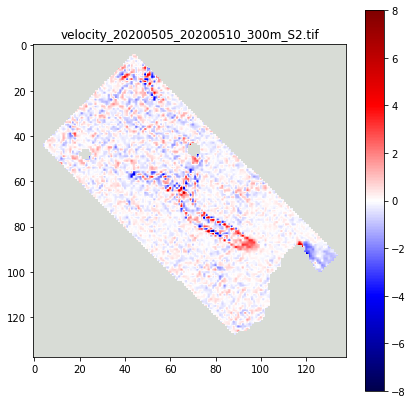

velocity_20210619_20210701_300m_S2.tif


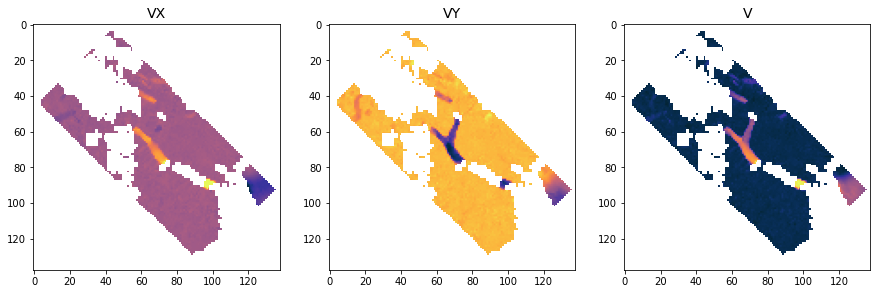

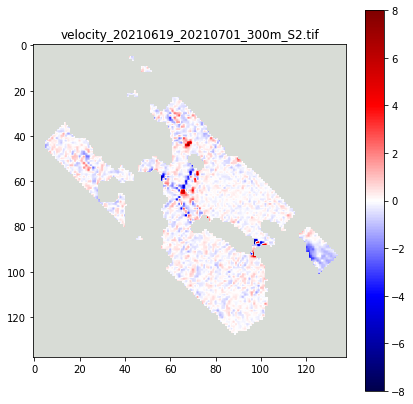

velocity_20210415_20210422_300m_S2.tif


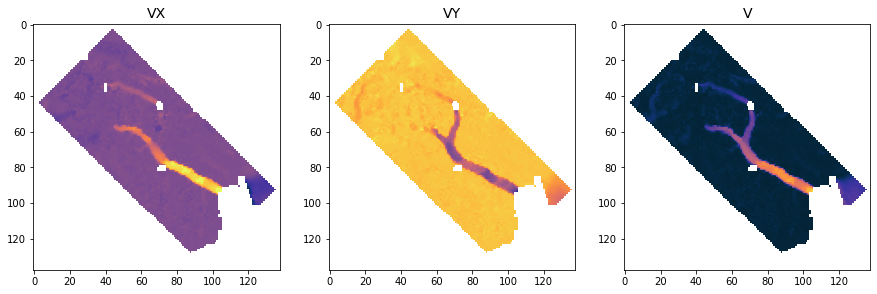

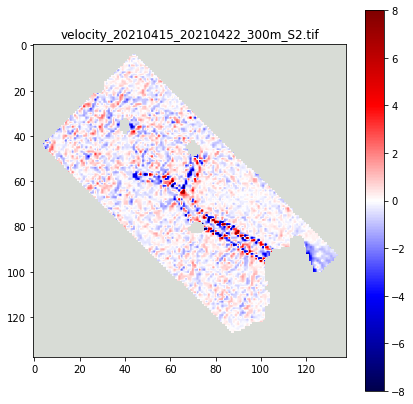

velocity_20180705_20180720_300m_S2.tif


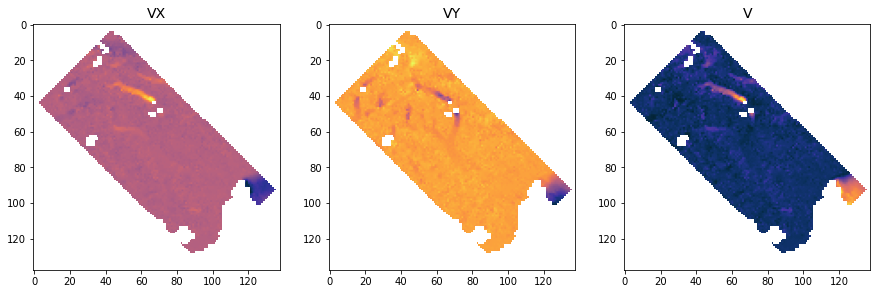

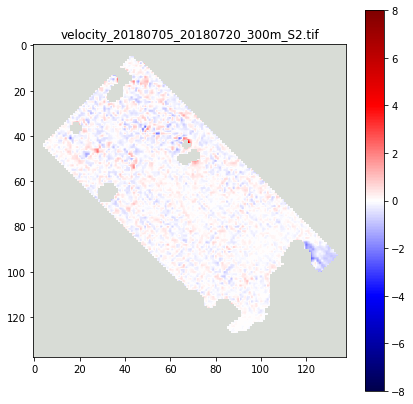

velocity_20180210_20180217_300m_S2.tif


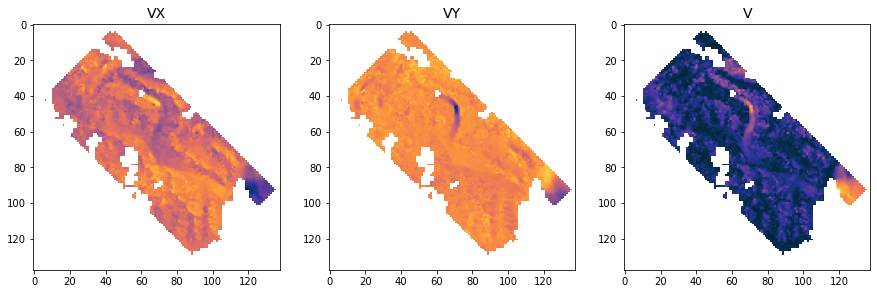

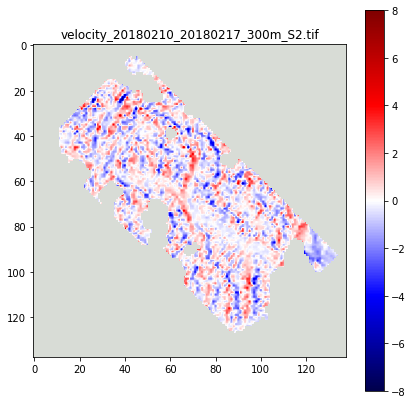

velocity_20190630_20190705_300m_S2.tif


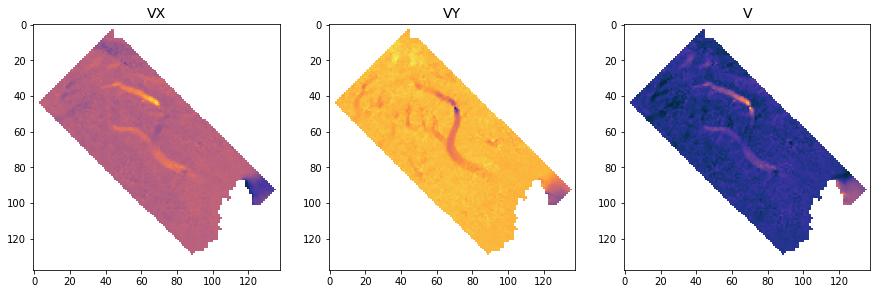

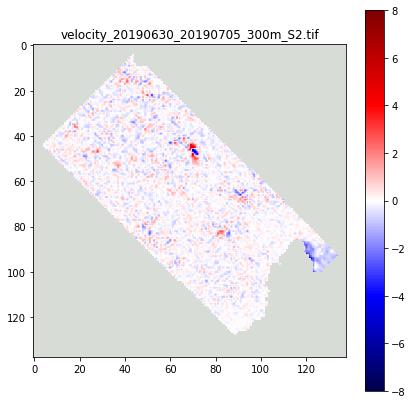

velocity_20130610_20130617_200m_LS.tif


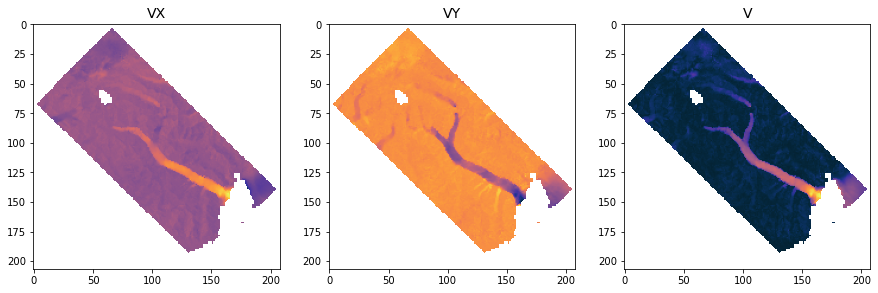

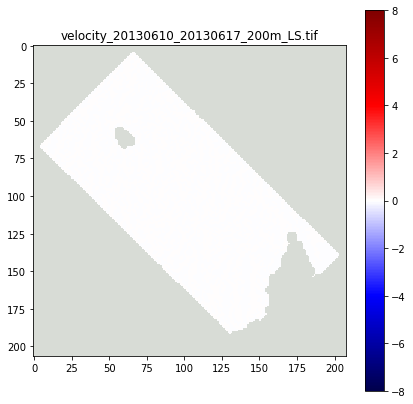

velocity_20130617_20130712_200m_LS.tif


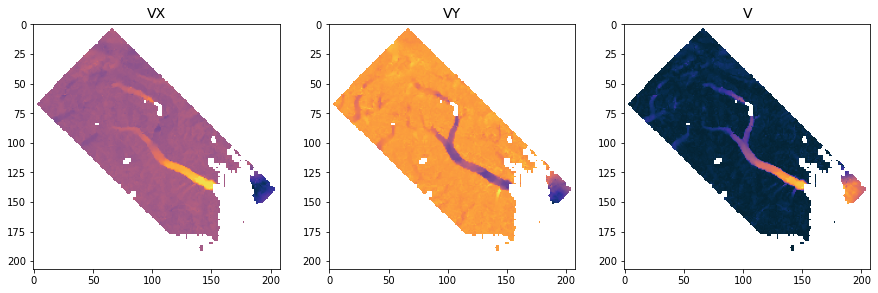

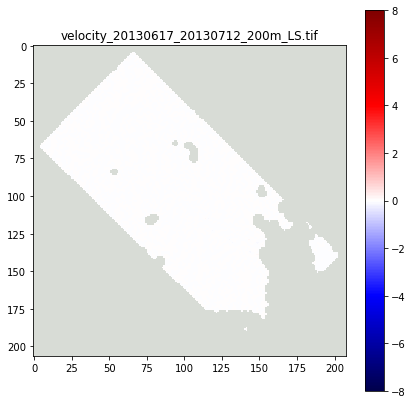

velocity_20150515_20150522_200m_LS.tif


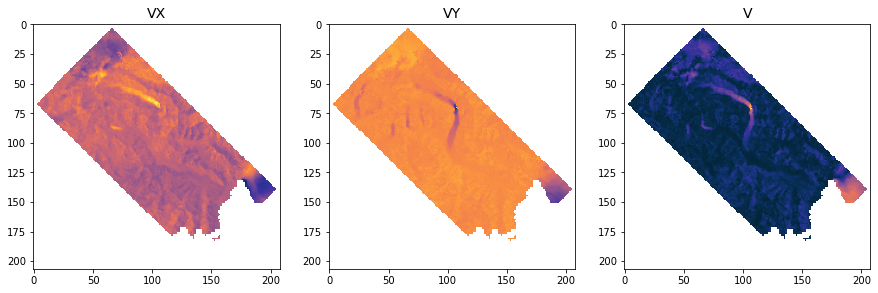

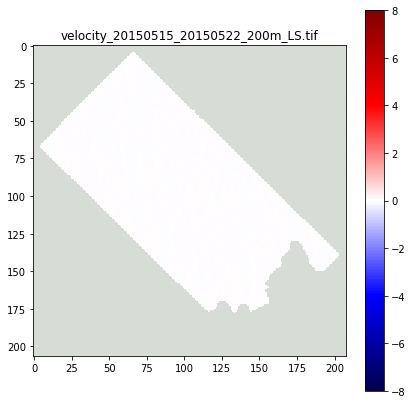

velocity_20220601_20220604_100m_S2.tif


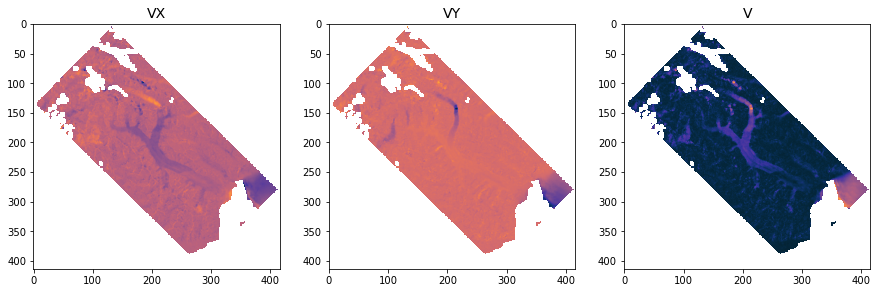

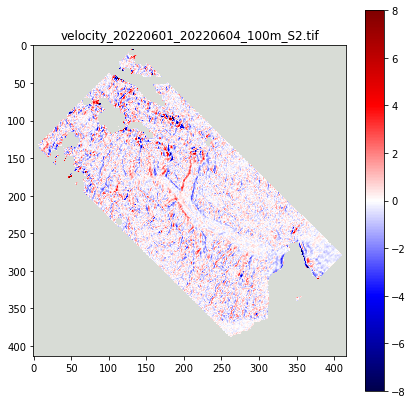

velocity_20220629_20220703_300m_S2.tif


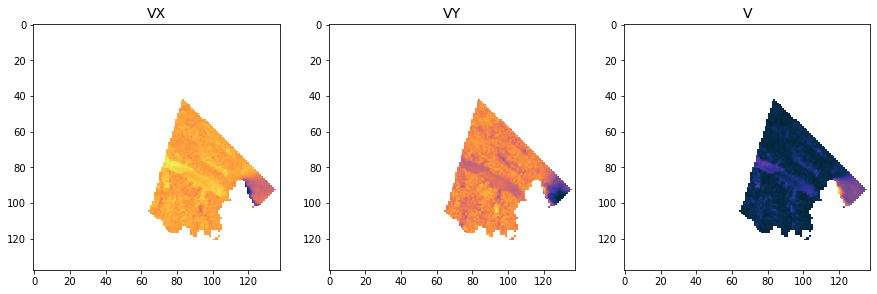

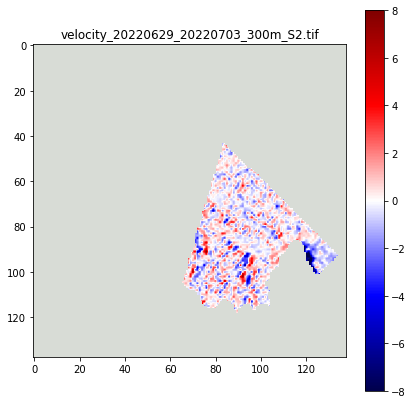

velocity_20220529_20220601_300m_S2.tif


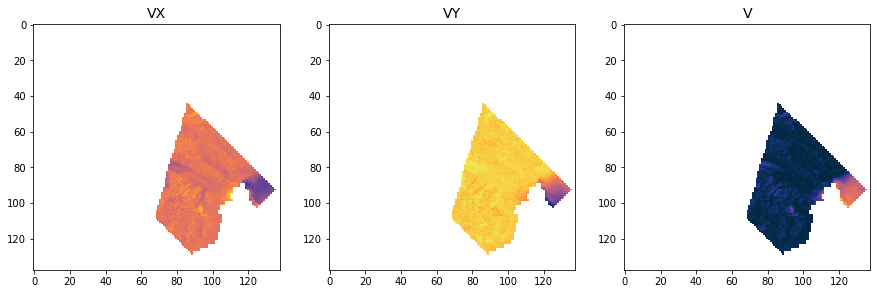

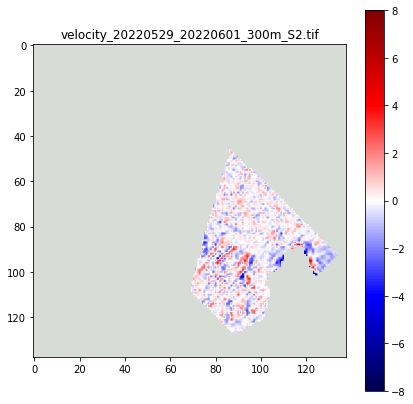

velocity_20220812_20220904_200m_S2.tif


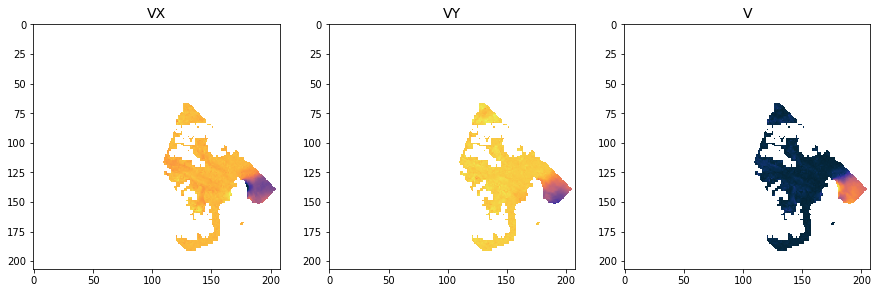

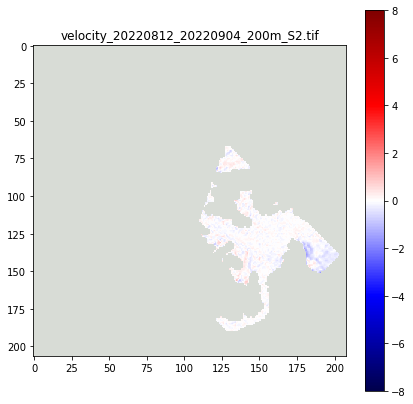

velocity_20210729_20210803_160m_S2.tif


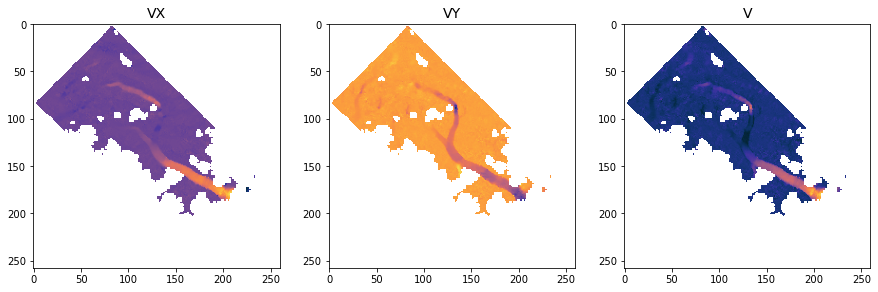

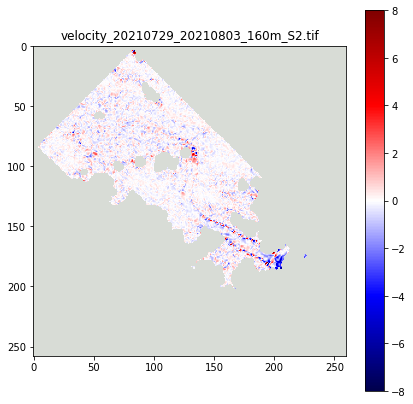

velocity_20210517_20210524_300m_S2.tif


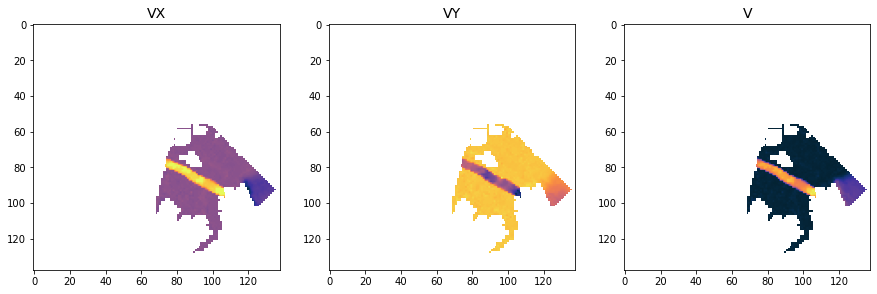

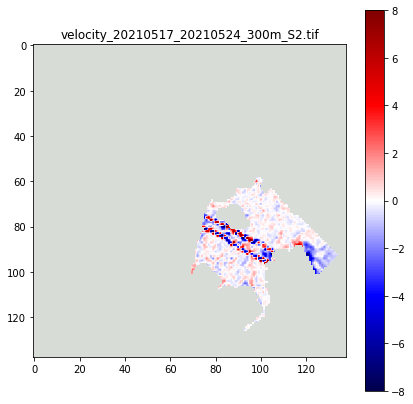

velocity_20140410_20140426_200m_LS.tif


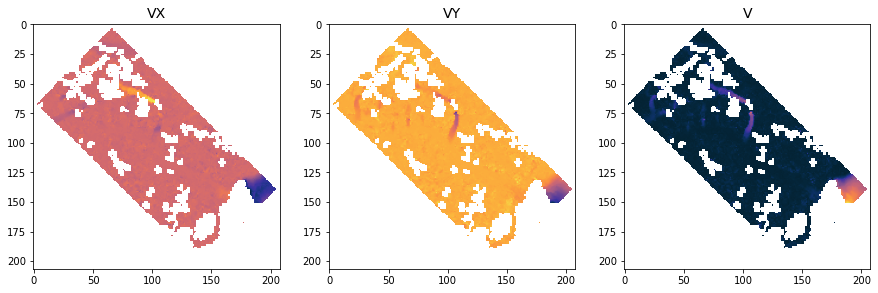

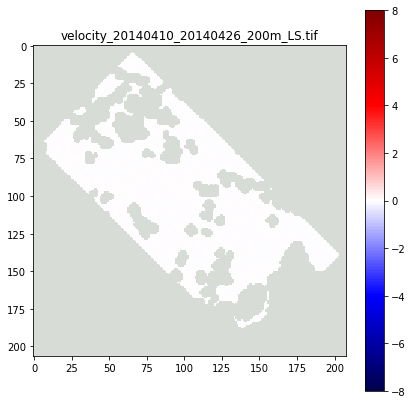

velocity_20210907_20210919_300m_S2.tif


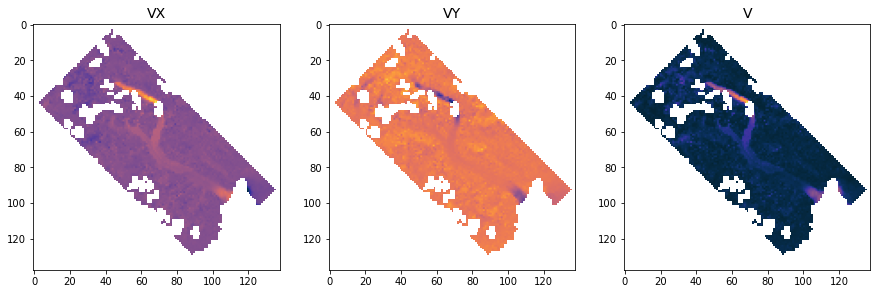

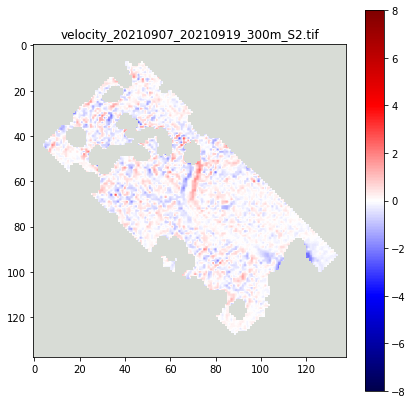

velocity_20220803_20220812_300m_S2.tif


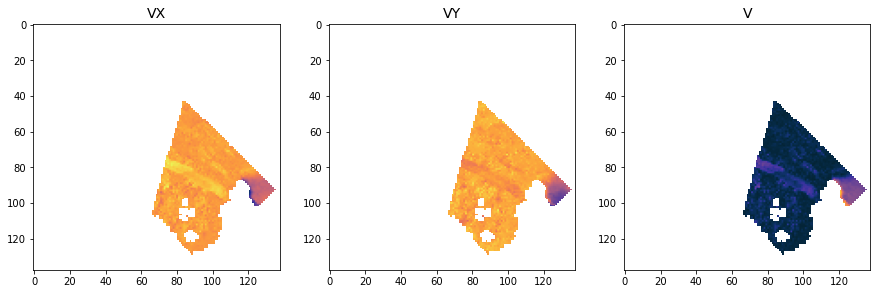

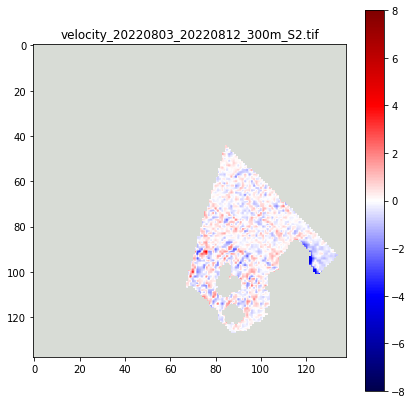

velocity_20160321_20160508_200m_LS.tif


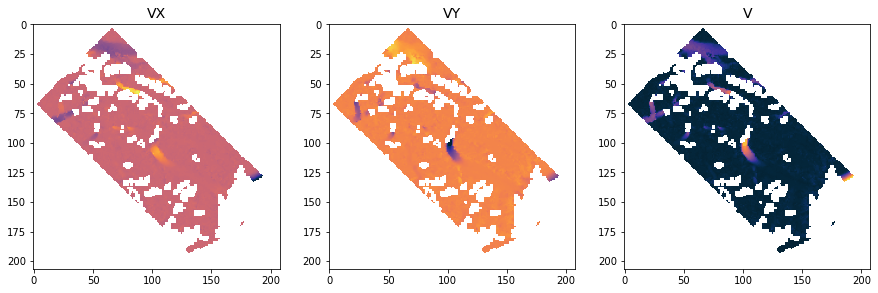

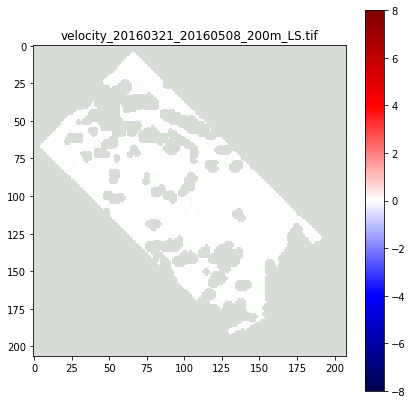

velocity_20190501_20190513_300m_S2.tif


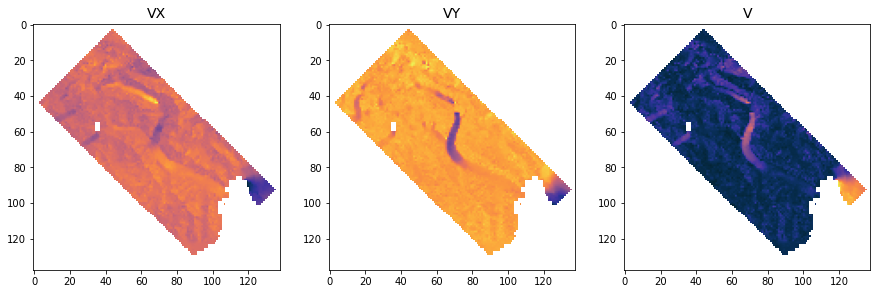

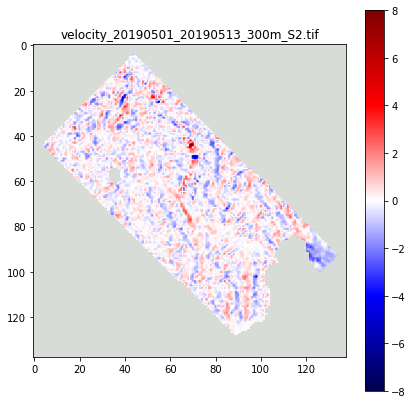

velocity_20180302_20180322_300m_S2.tif


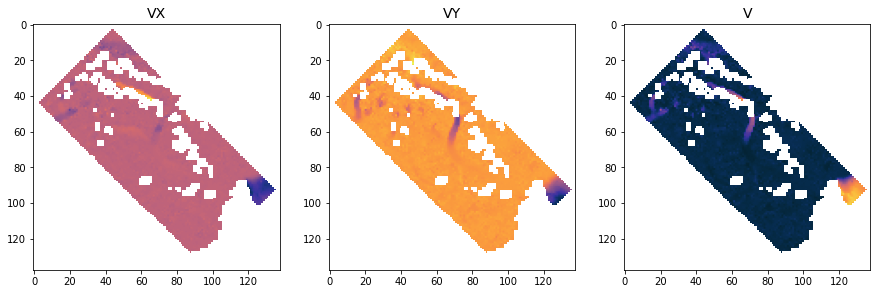

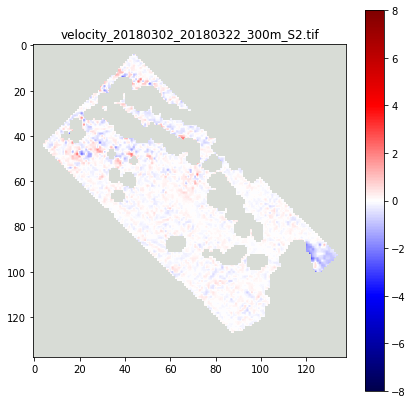

velocity_20220320_20220326_200m_S2.tif


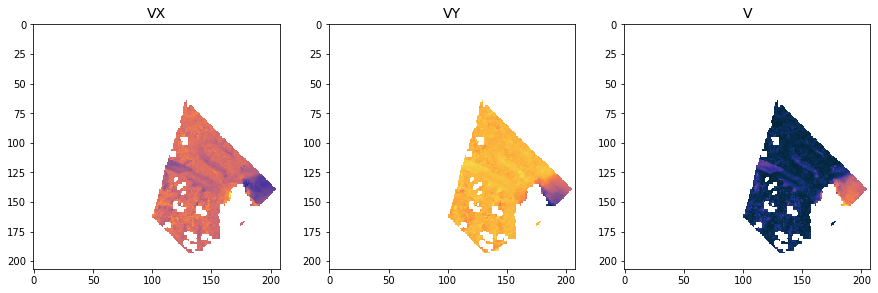

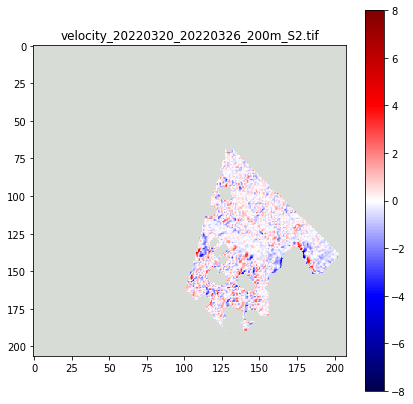

velocity_20220331_20220409_300m_S2.tif


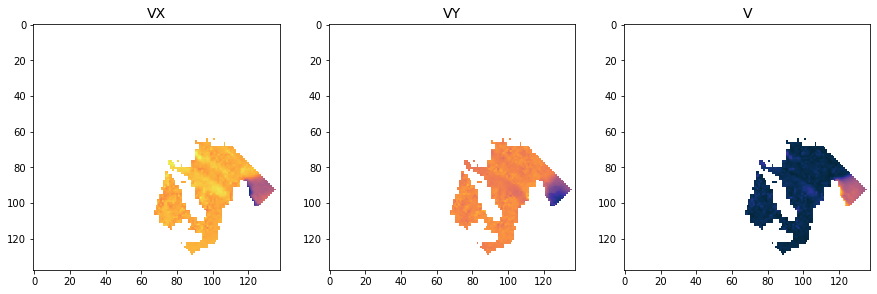

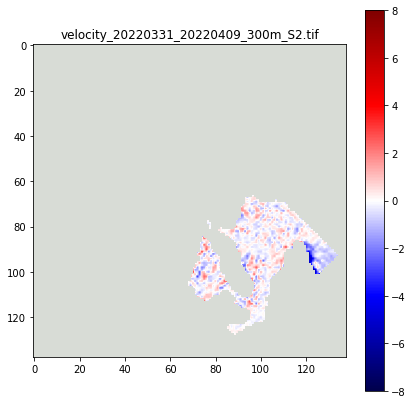

velocity_20190730_20190804_300m_S2.tif


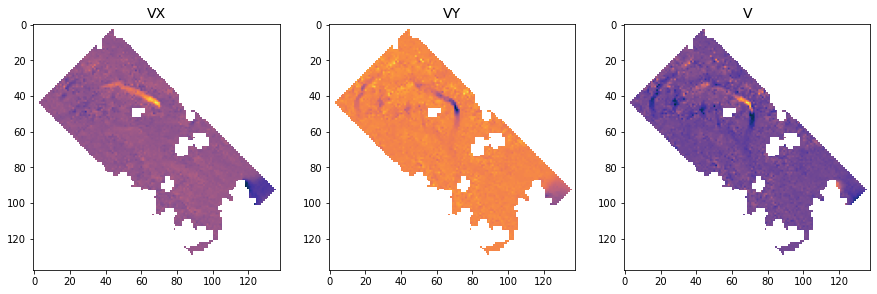

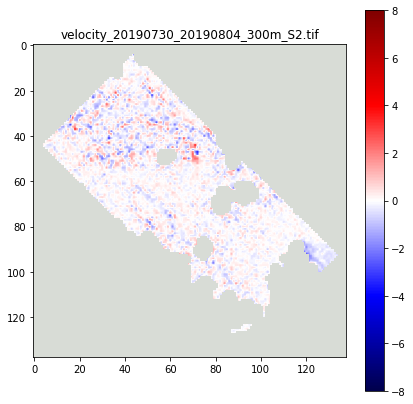

velocity_20220604_20220608_100m_S2.tif


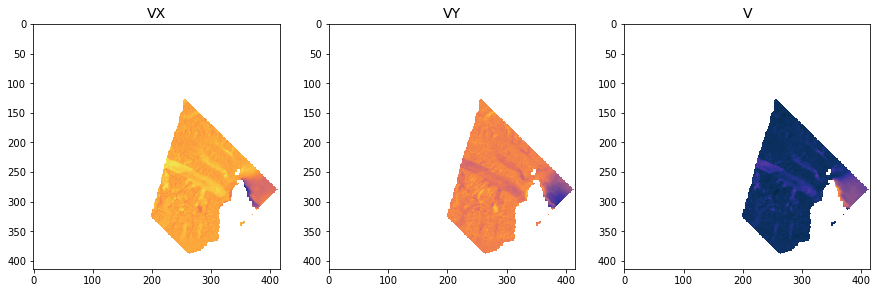

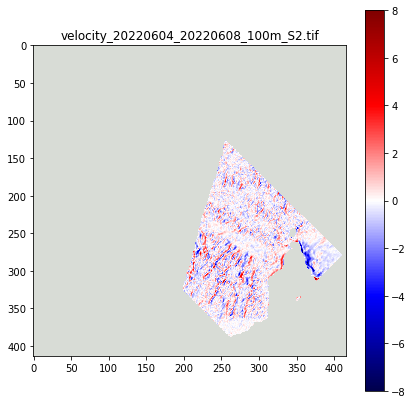

velocity_20190819_20190829_160m_S2.tif


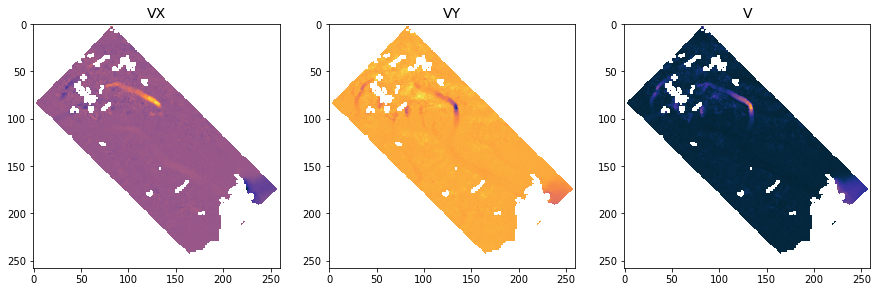

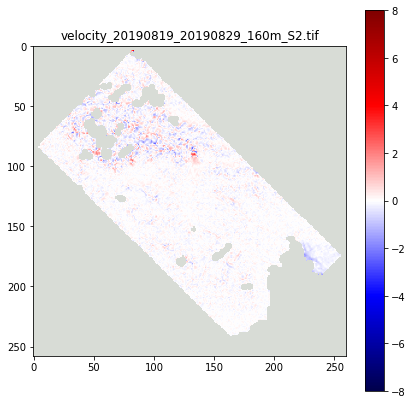

velocity_20160609_20160711_200m_LS.tif


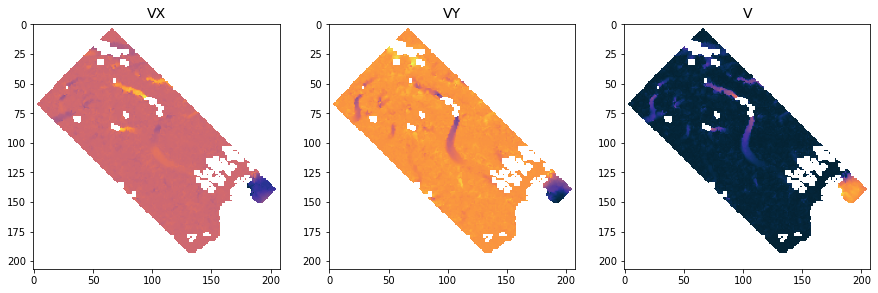

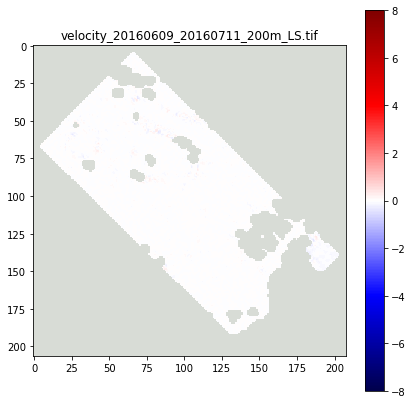

velocity_20210502_20210505_160m_S2.tif


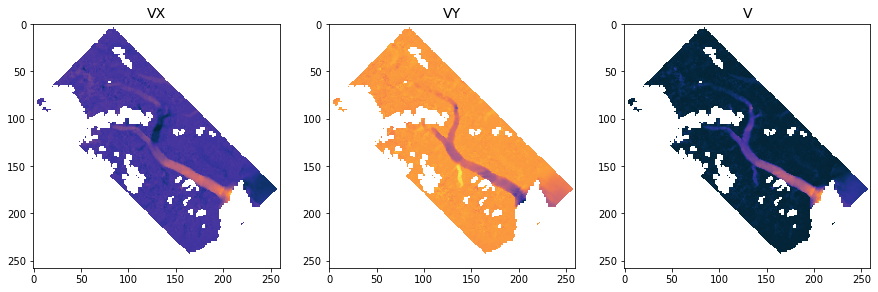

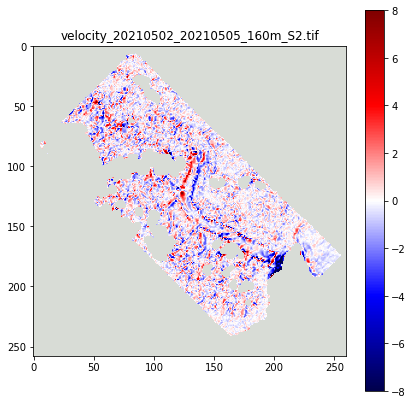

velocity_20160508_20160609_200m_LS.tif


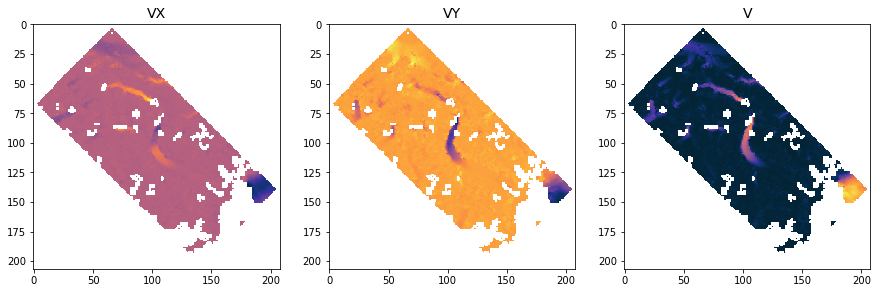

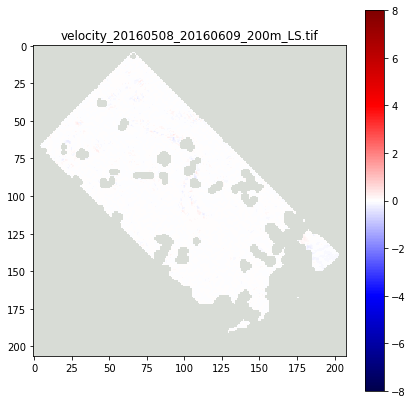

velocity_20220708_20220729_200m_S2.tif


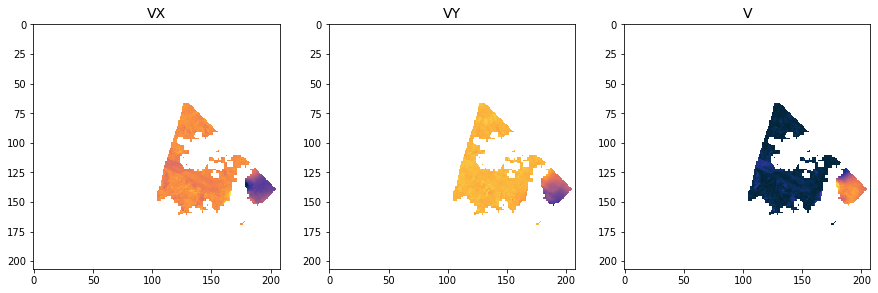

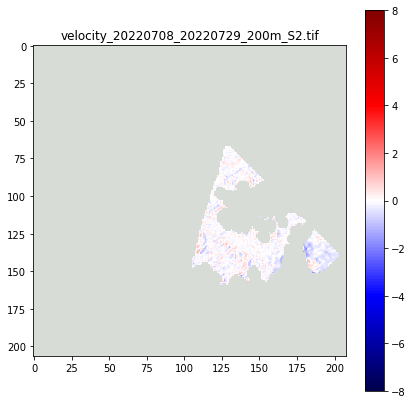

velocity_20210422_20210425_200m_S2.tif


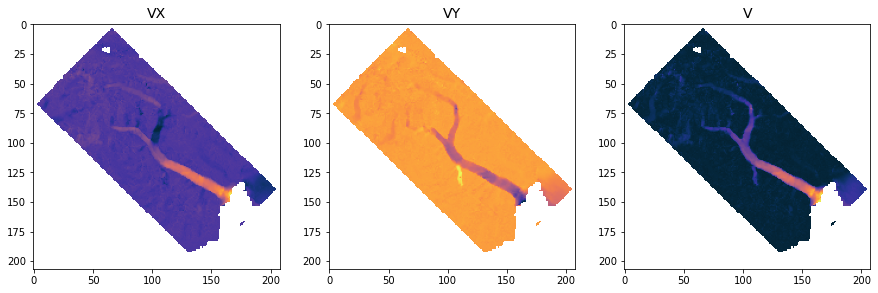

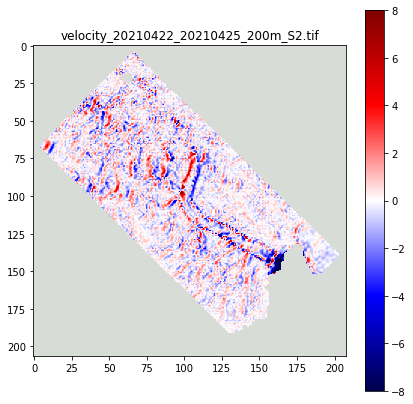

velocity_20140731_20140823_200m_LS.tif


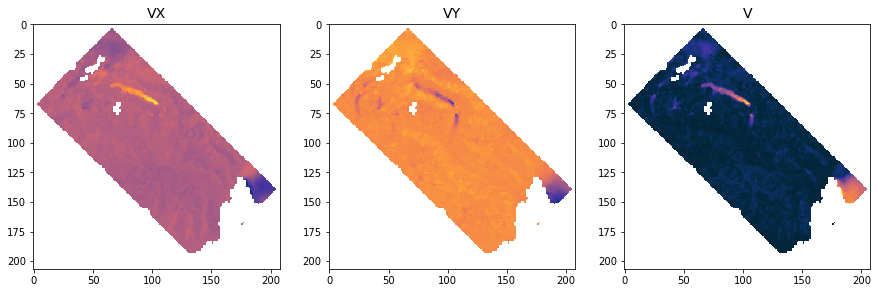

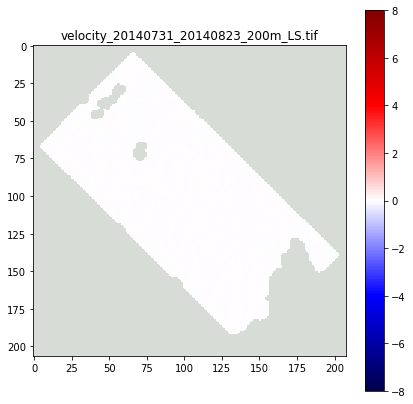

velocity_20170423_20170506_100m_S2.tif


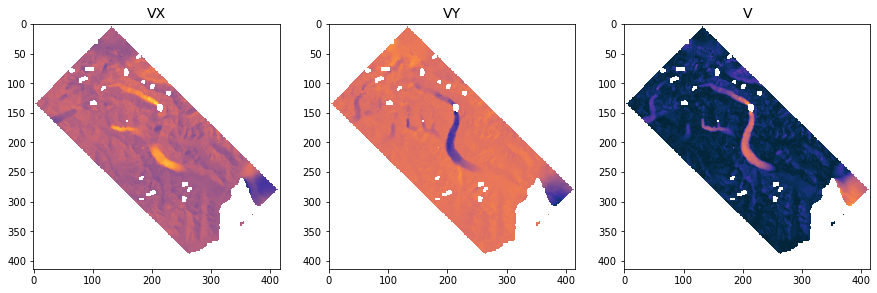

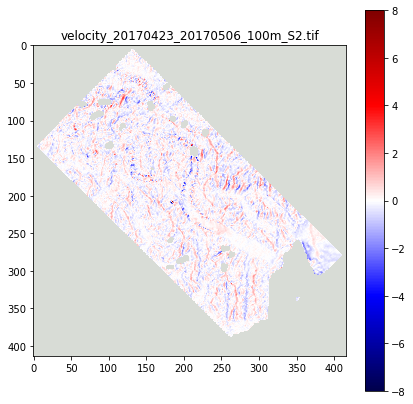

velocity_20180411_20180416_160m_S2.tif


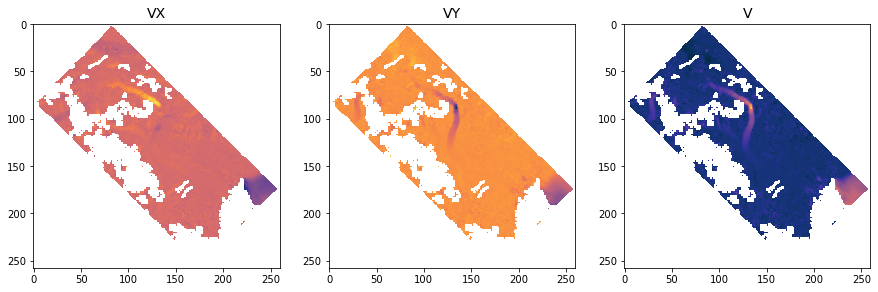

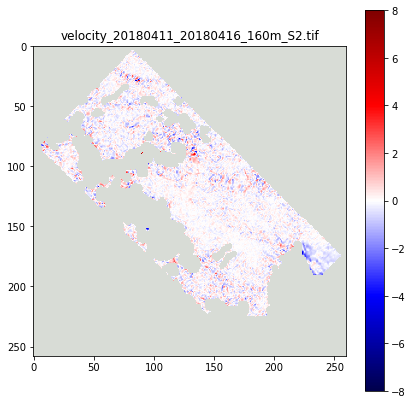

velocity_20190607_20190610_200m_S2.tif


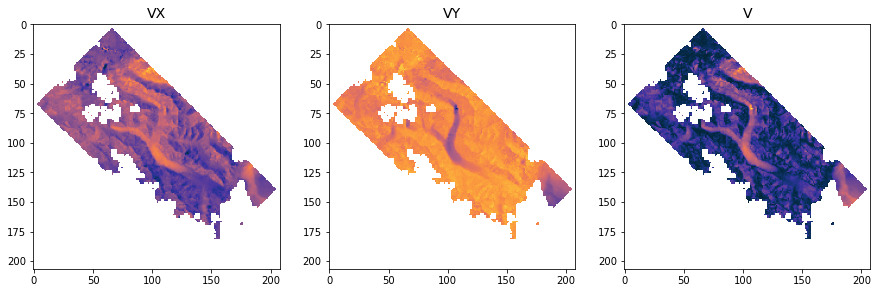

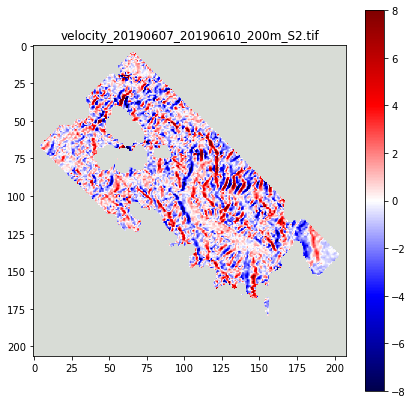

velocity_20130712_20130728_200m_LS.tif


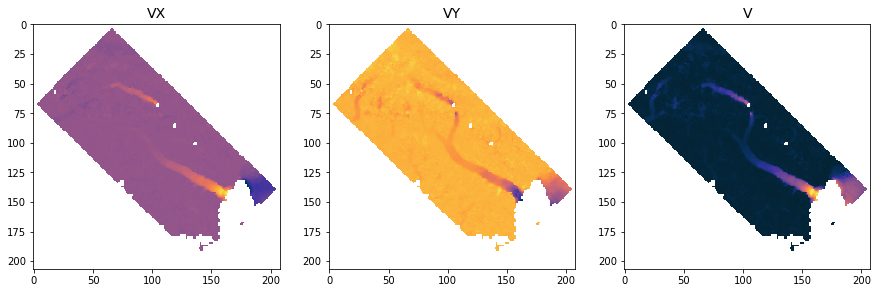

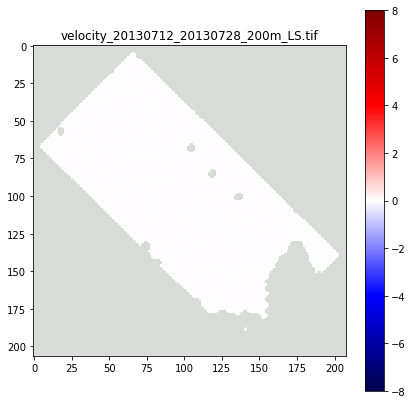

velocity_20220703_20220708_200m_S2.tif


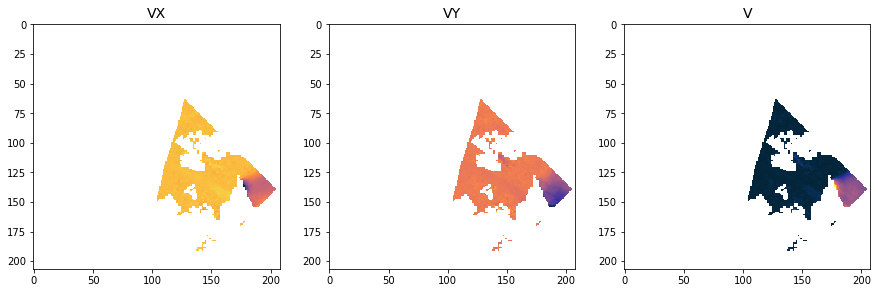

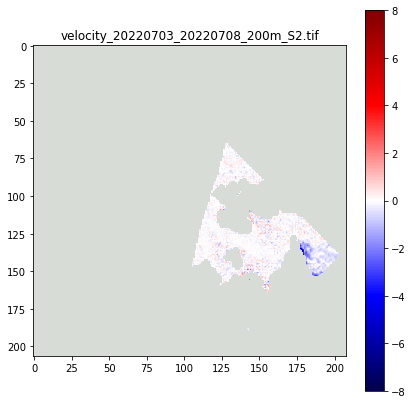

velocity_20170723_20170808_200m_LS.tif


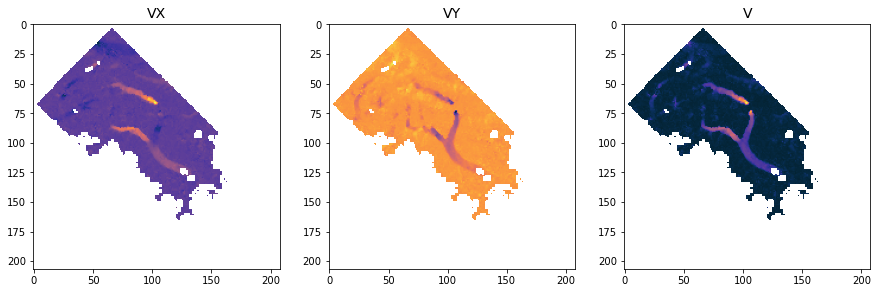

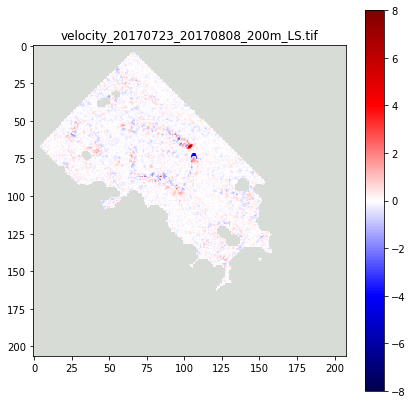

velocity_20190118_20190131_100m_S2.tif


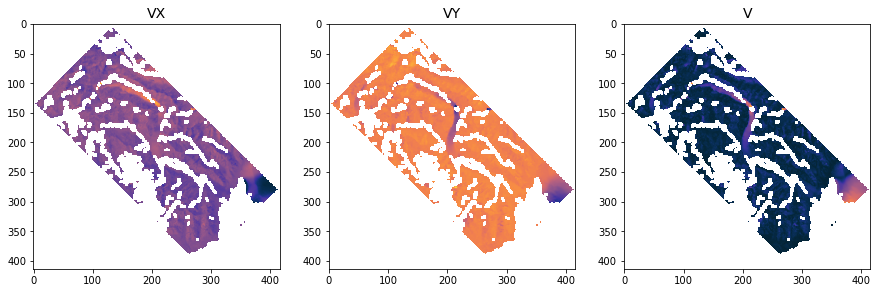

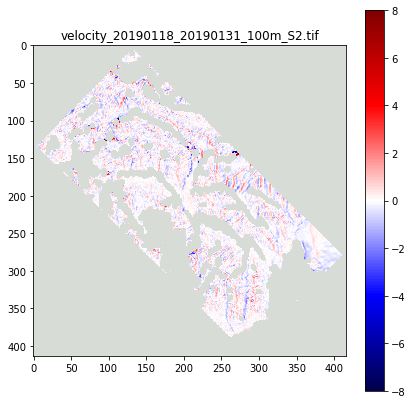

velocity_20181102_20181107_300m_S2.tif


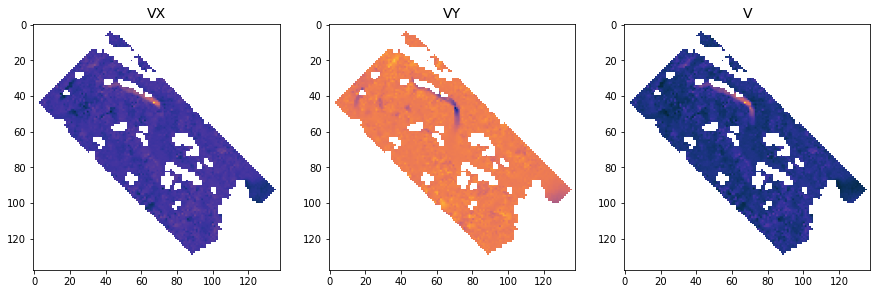

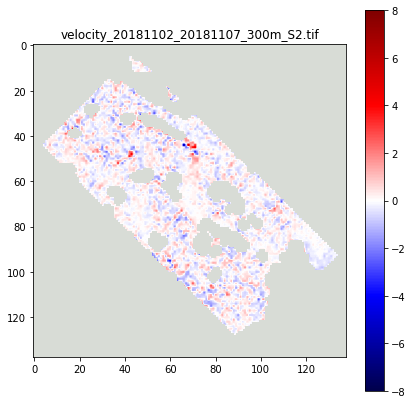

velocity_20220415_20220419_100m_S2.tif


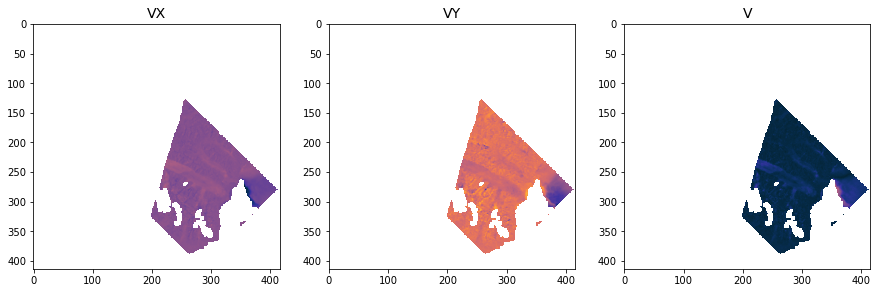

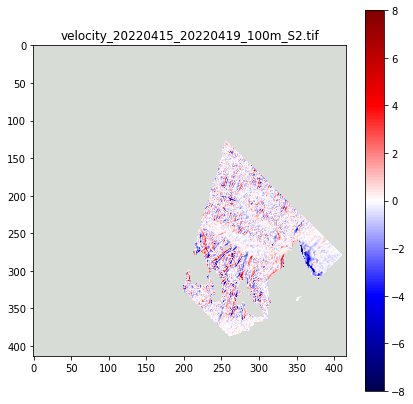

velocity_20220616_20220623_200m_S2.tif


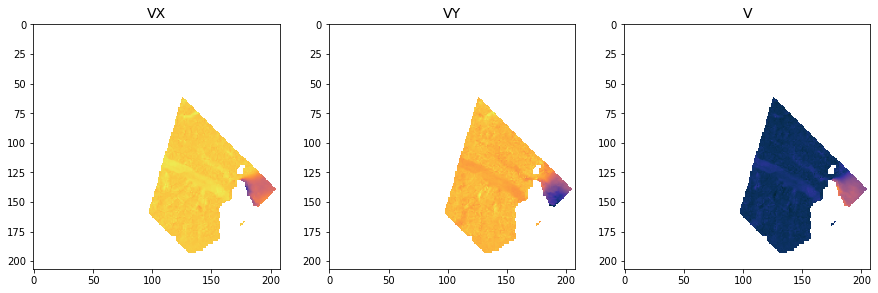

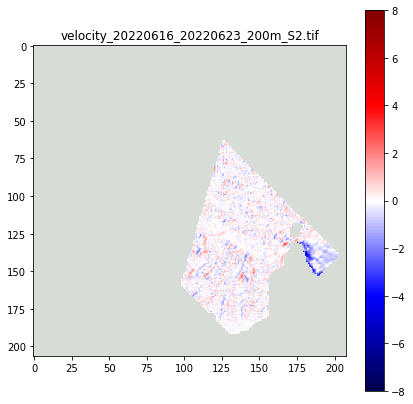

velocity_20190620_20190625_300m_S2.tif


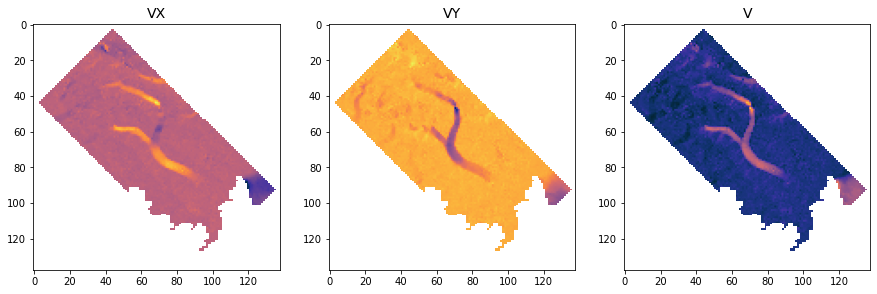

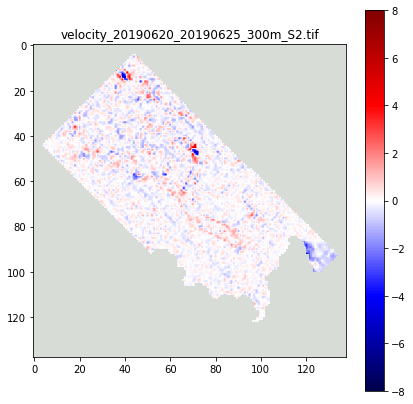

velocity_20210303_20210312_200m_LS.tif


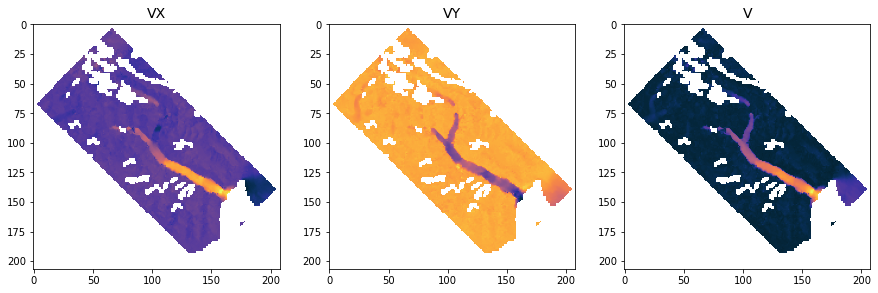

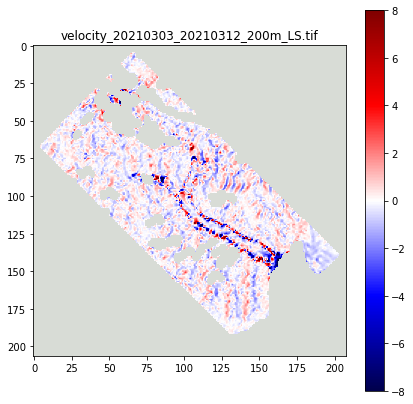

velocity_20190426_20190501_160m_S2.tif


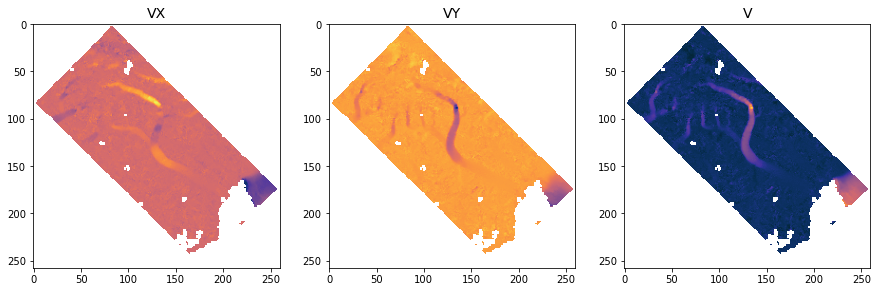

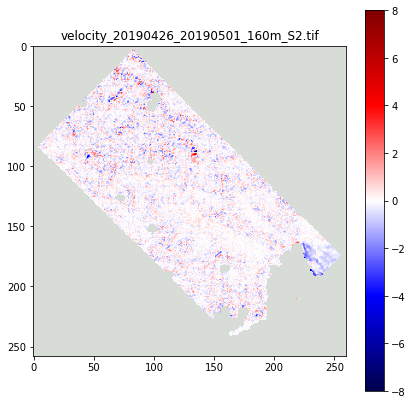

velocity_20210704_20210716_300m_S2.tif


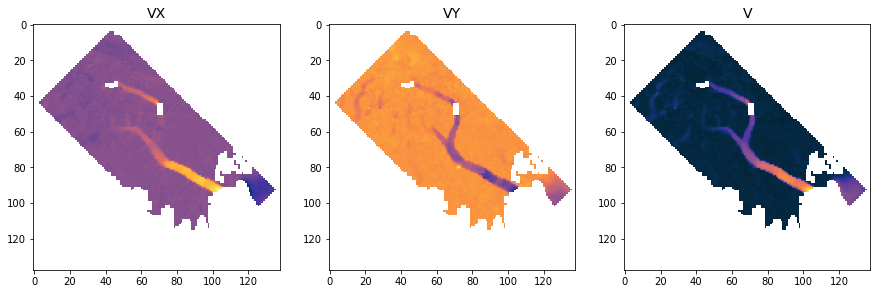

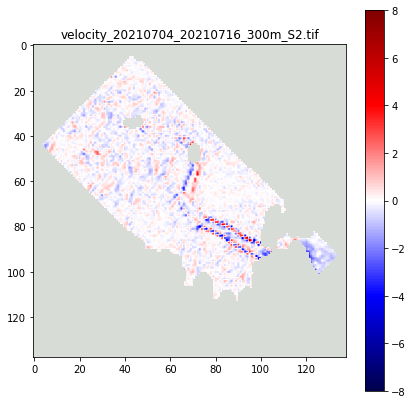

velocity_20220729_20220803_300m_S2.tif


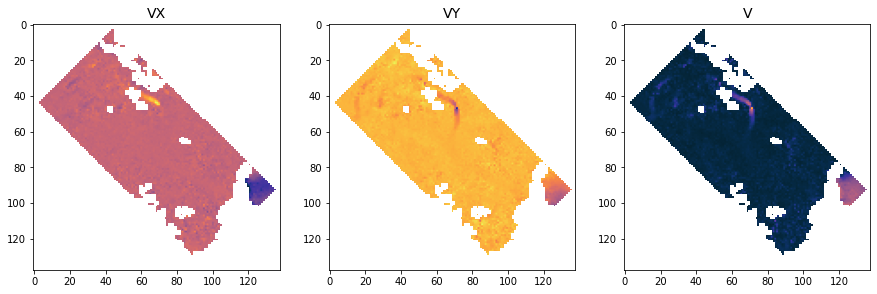

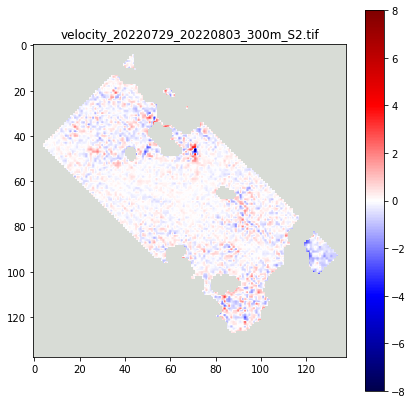

velocity_20190705_20190710_200m_S2.tif


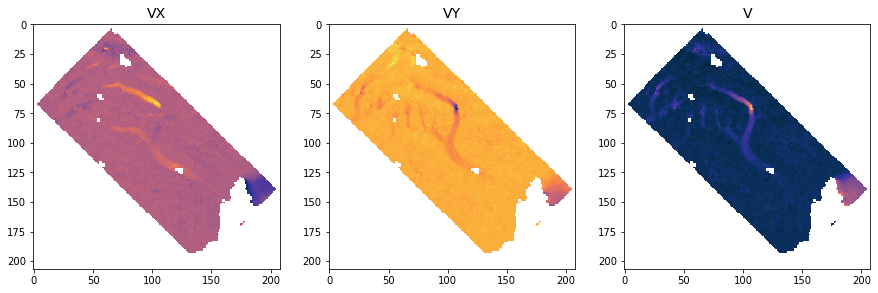

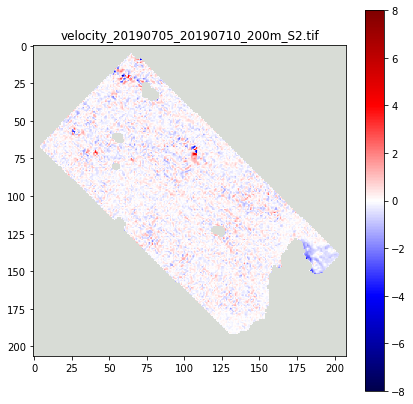

velocity_20180516_20180531_160m_S2.tif


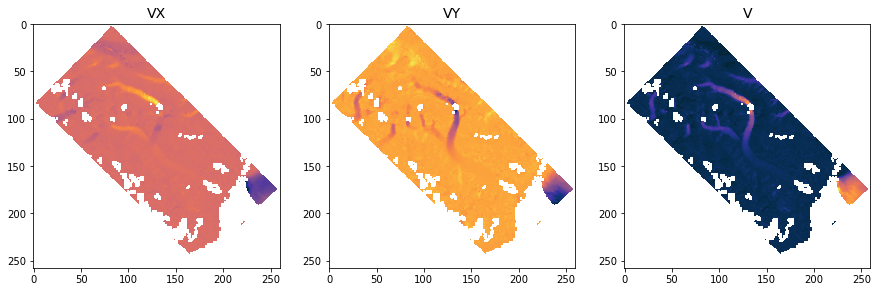

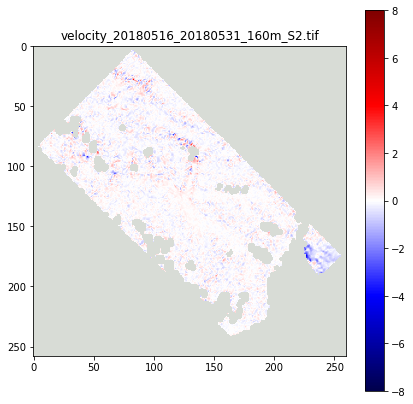

velocity_20220512_20220515_100m_S2.tif


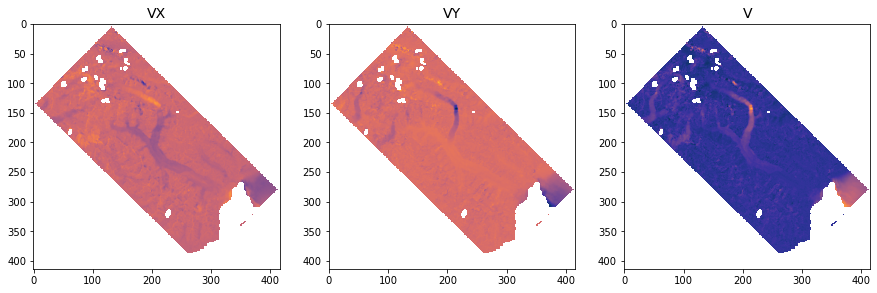

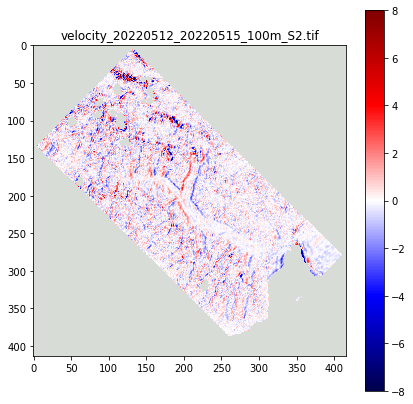

velocity_20210312_20210319_200m_LS.tif


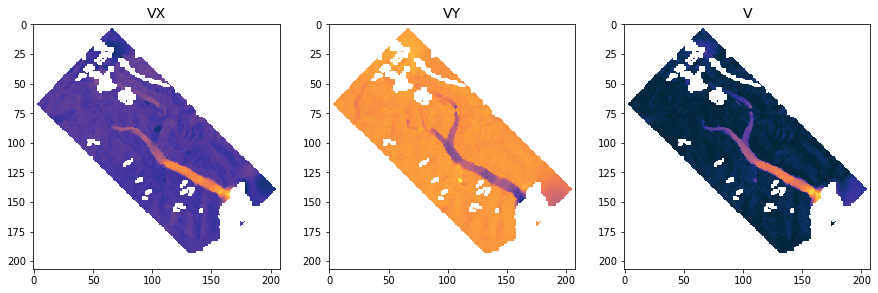

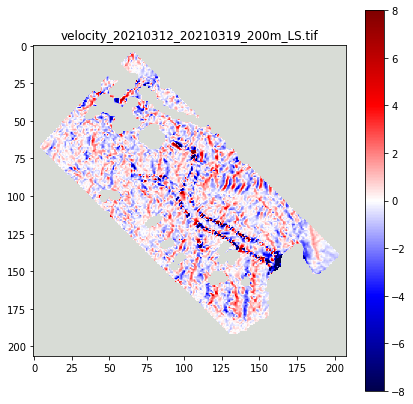

velocity_20210614_20210619_200m_S2.tif


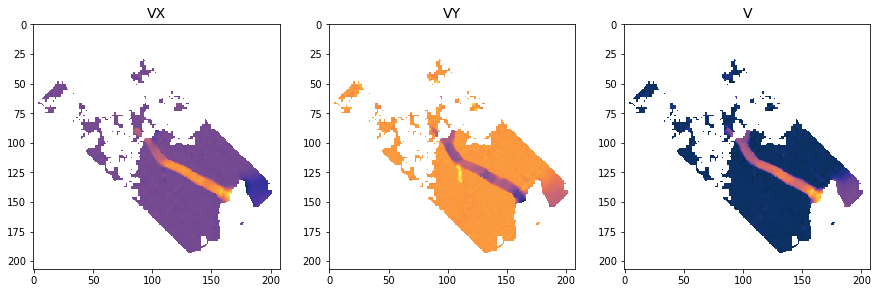

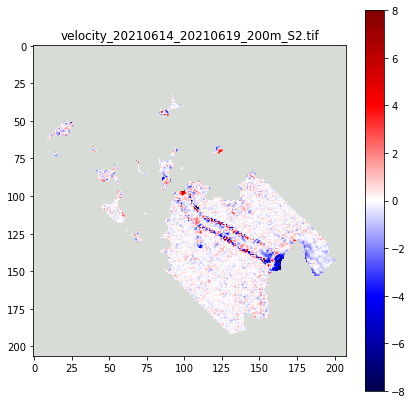

velocity_20190131_20190207_160m_S2.tif


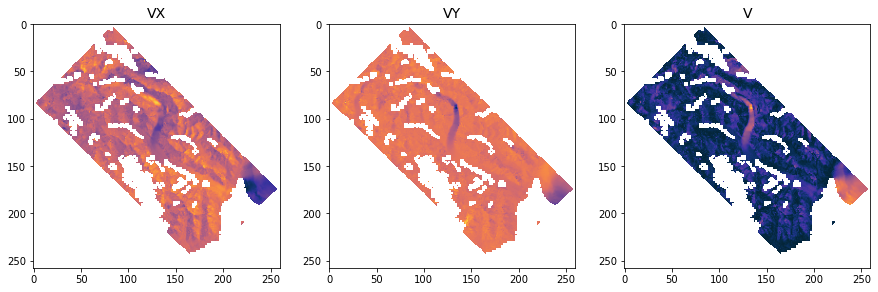

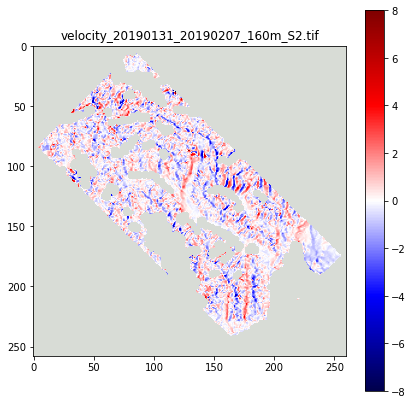

velocity_20220419_20220430_100m_S2.tif


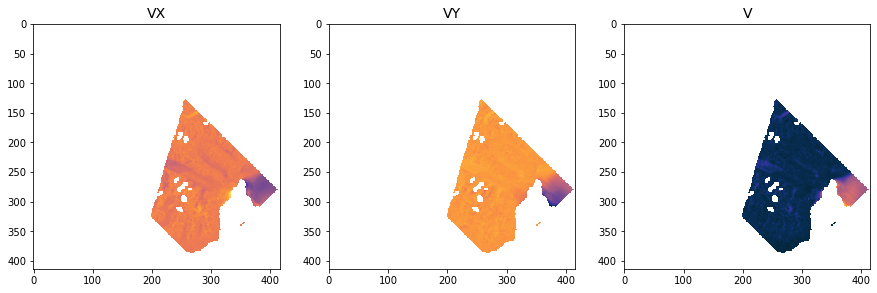

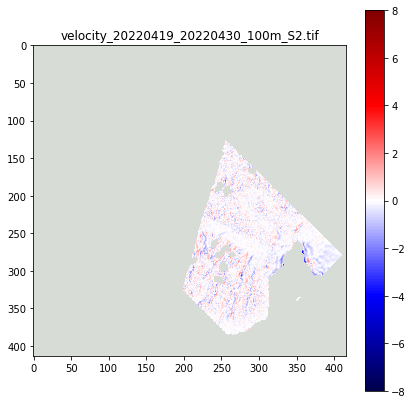

velocity_20140503_20140604_200m_LS.tif


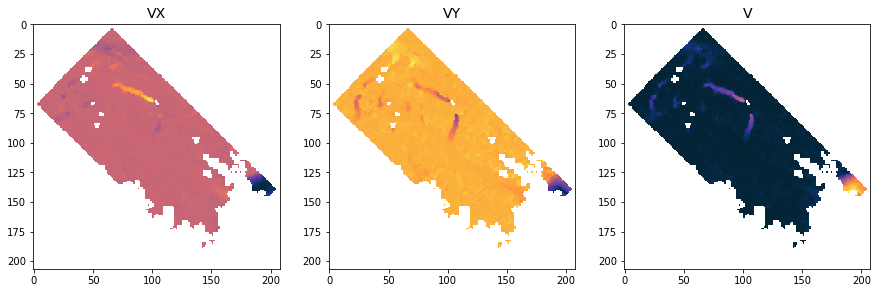

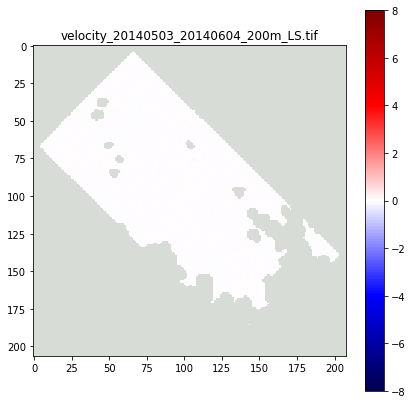

velocity_20150531_20150623_200m_LS.tif


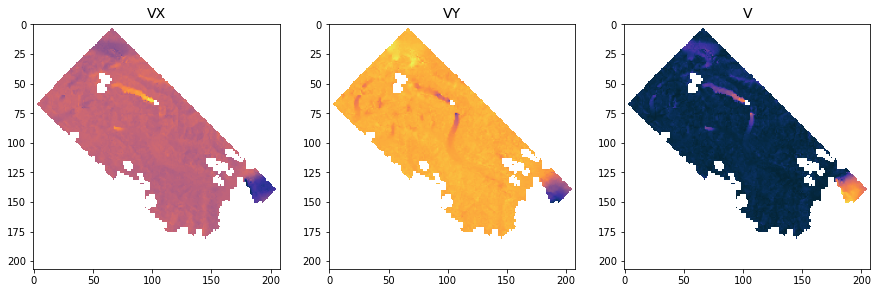

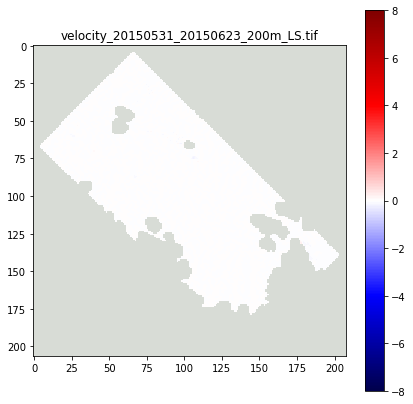

velocity_20220608_20220611_100m_S2.tif


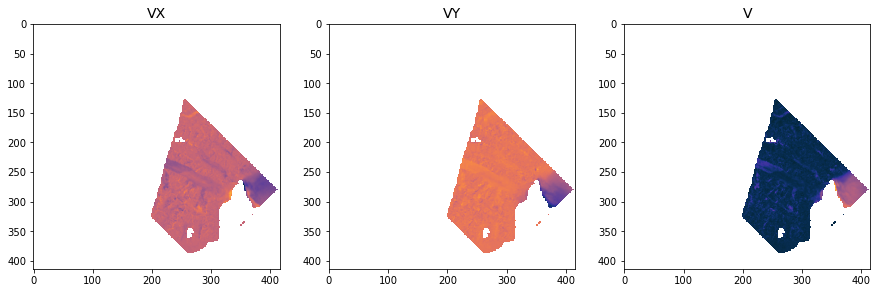

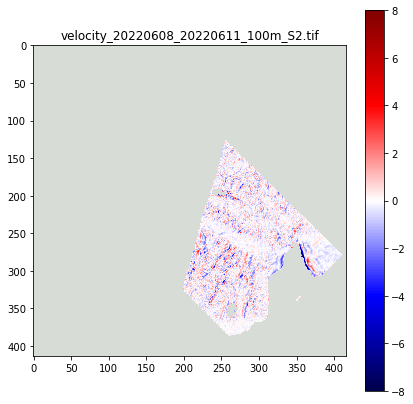

velocity_20130728_20130813_200m_LS.tif


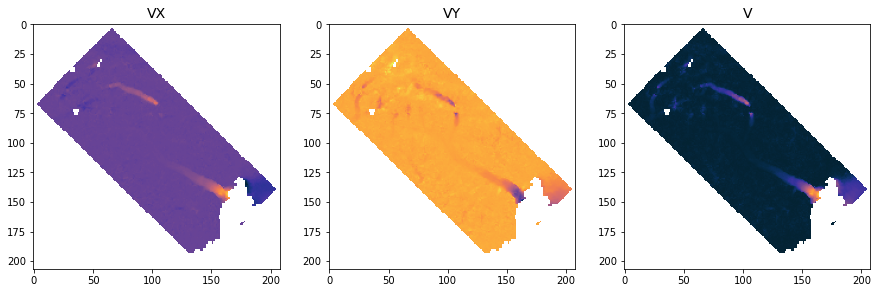

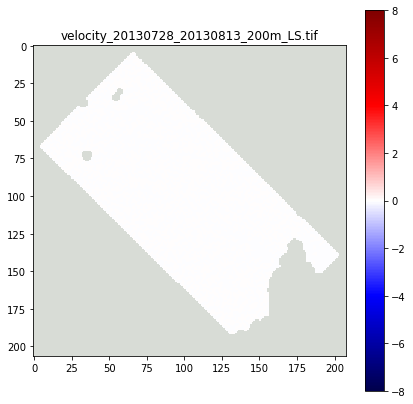

velocity_20220626_20220629_100m_S2.tif


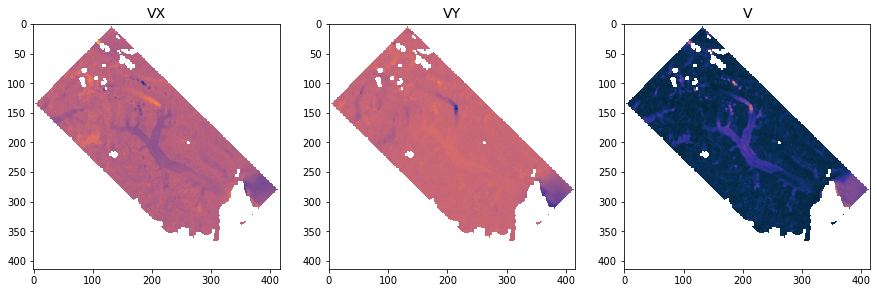

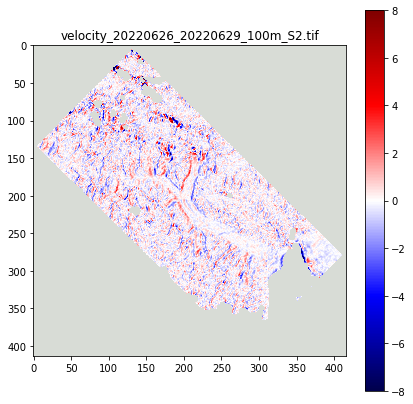

velocity_20200914_20200924_350m_S2.tif


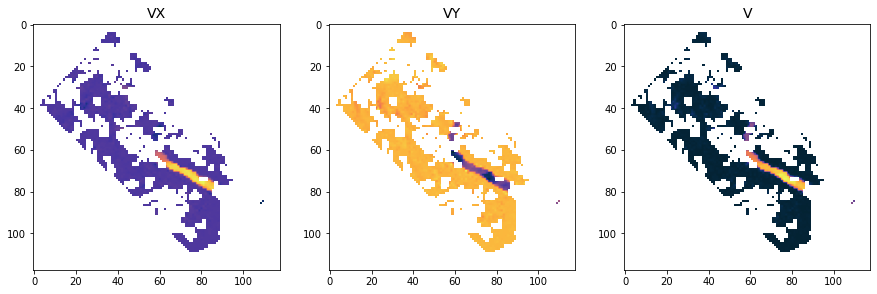

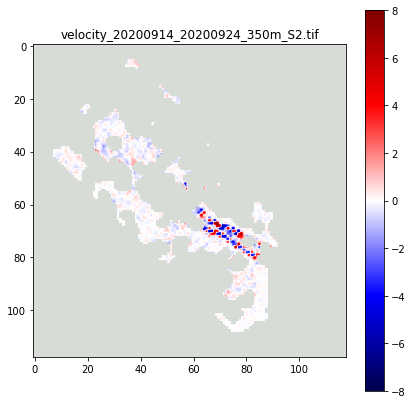

velocity_20150328_20150413_200m_LS.tif


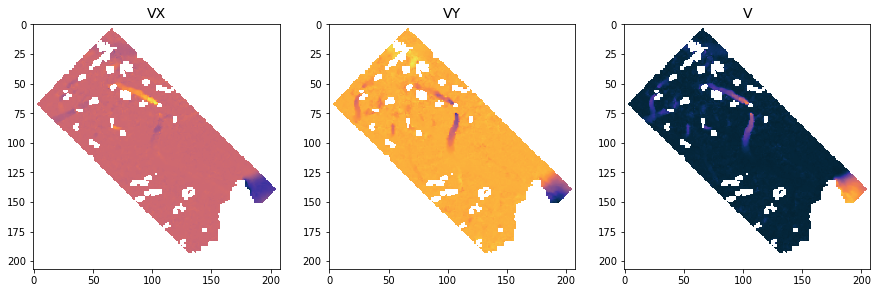

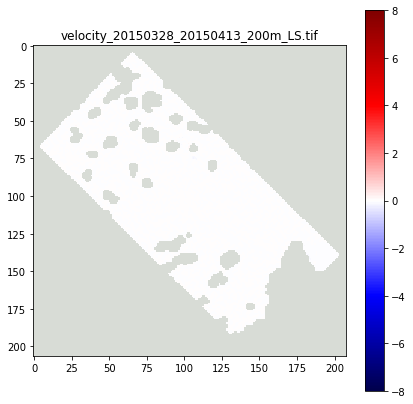

velocity_20220522_20220525_100m_S2.tif


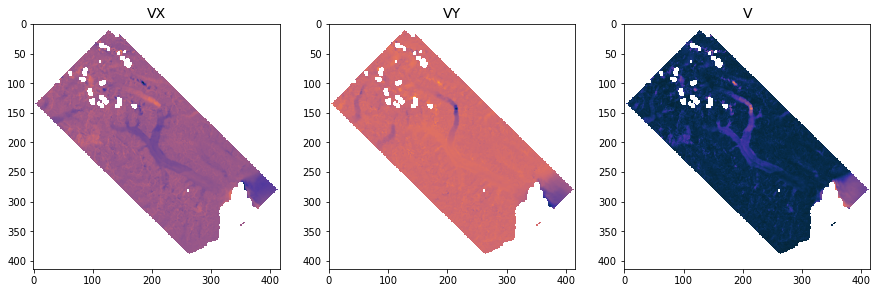

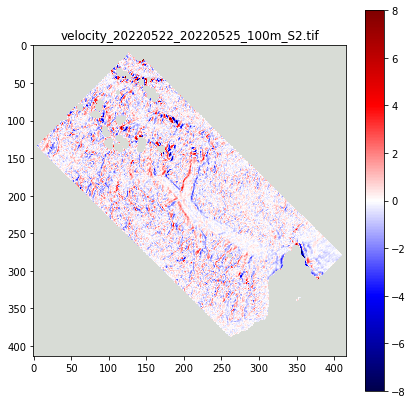

velocity_20220525_20220529_300m_S2.tif


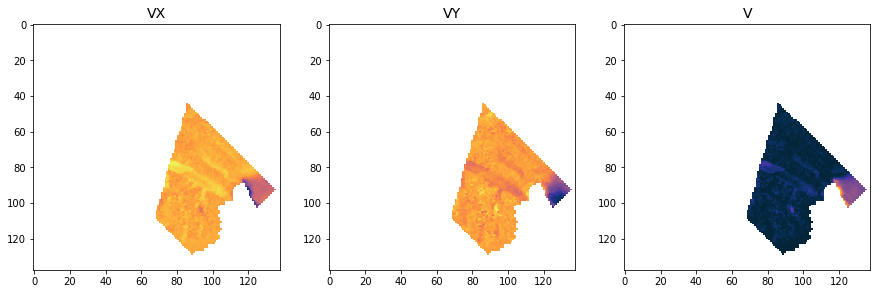

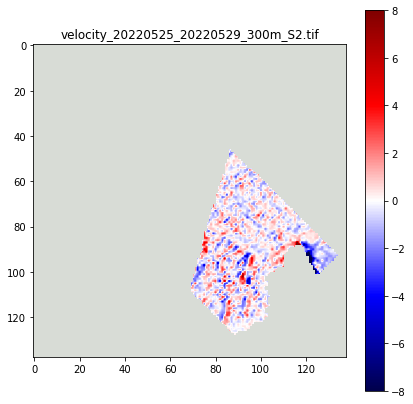

velocity_20160314_20160321_200m_LS.tif


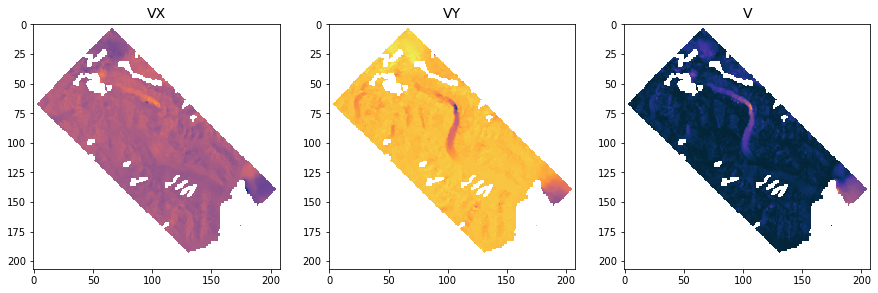

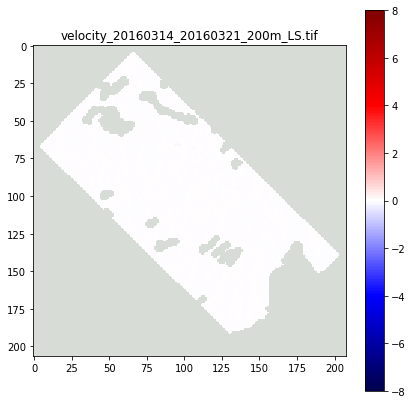

velocity_20210402_20210415_160m_S2.tif


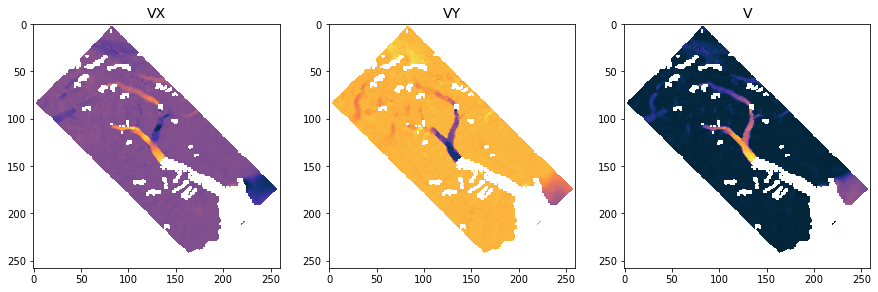

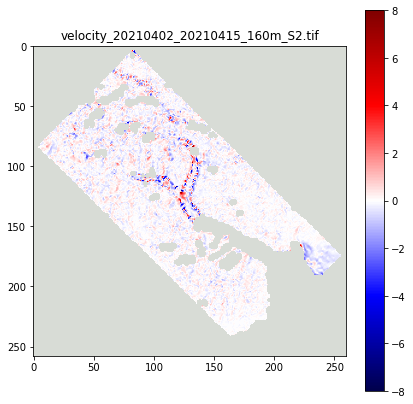

velocity_20170602_20170705_200m_S2.tif


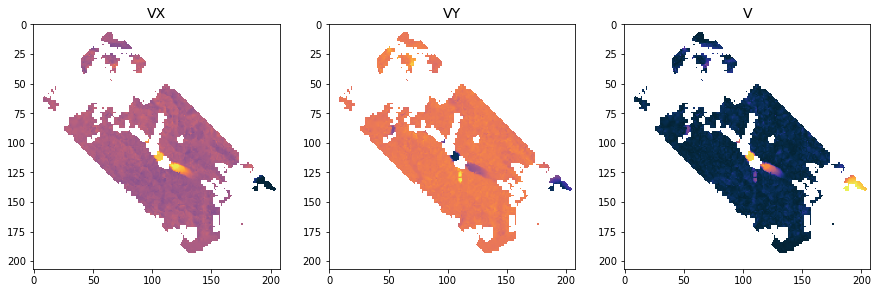

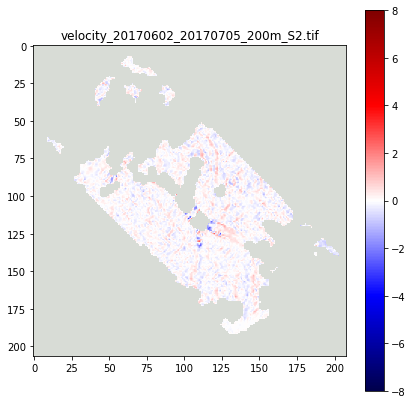

velocity_20130414_20130610_200m_LS.tif


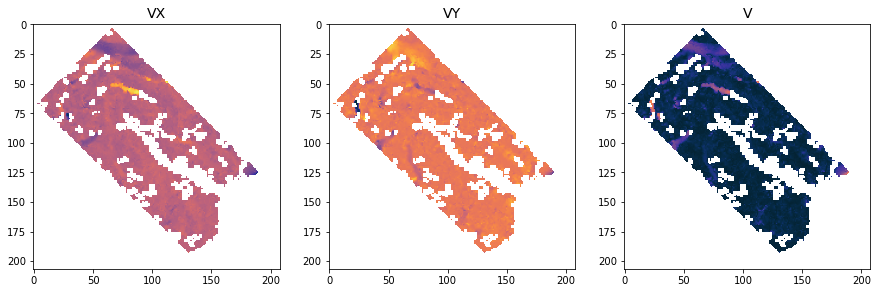

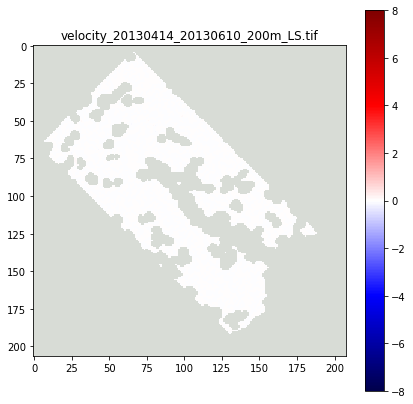

velocity_20170220_20170317_200m_LS.tif


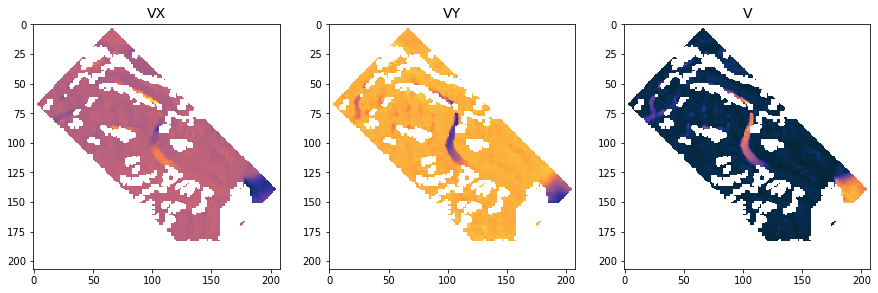

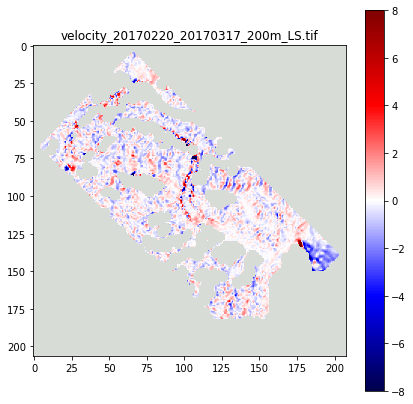

velocity_20200904_20200914_160m_S2.tif


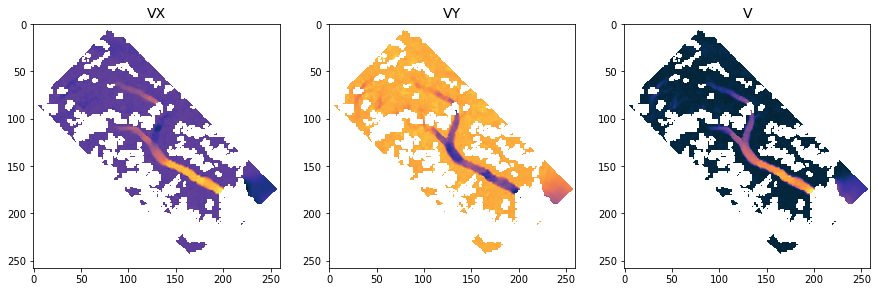

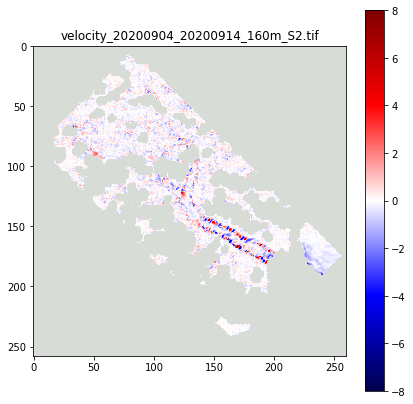

velocity_20191003_20191008_160m_S2.tif


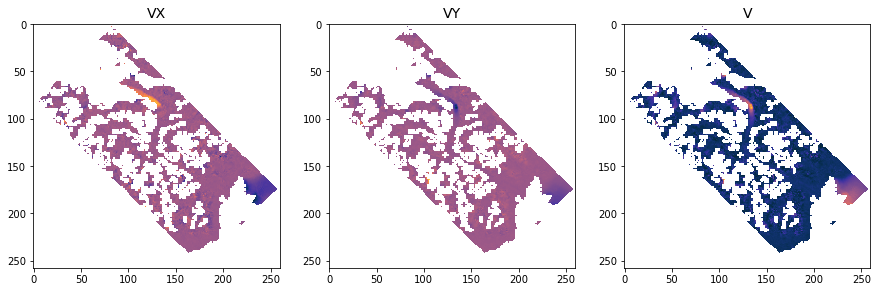

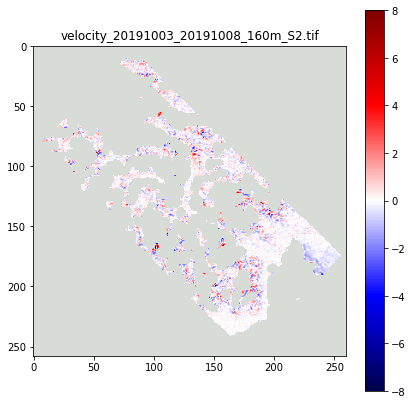

velocity_20200716_20200726_100m_S2.tif


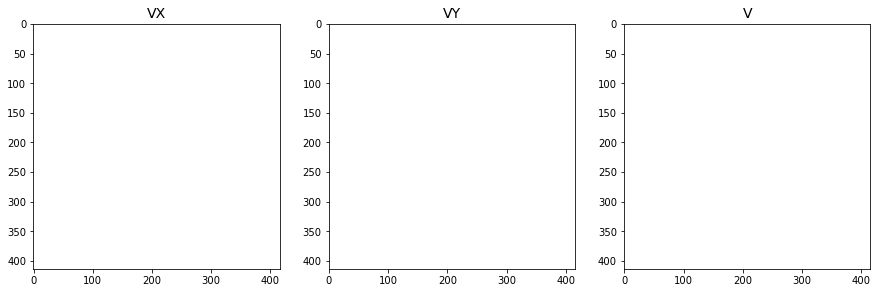

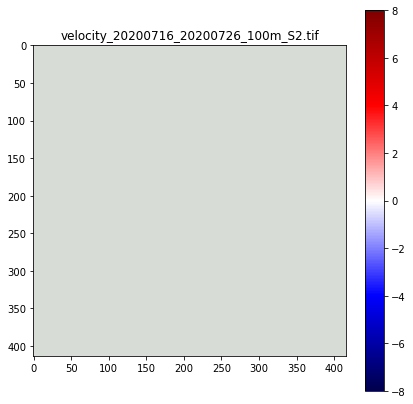

velocity_20220430_20220505_300m_S2.tif


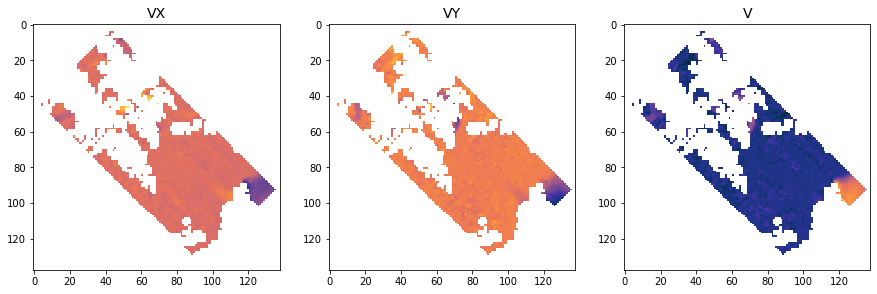

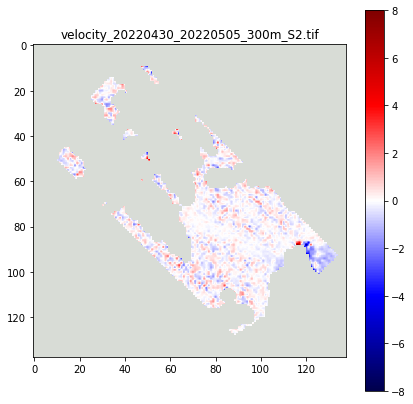

velocity_20140325_20140401_200m_LS.tif


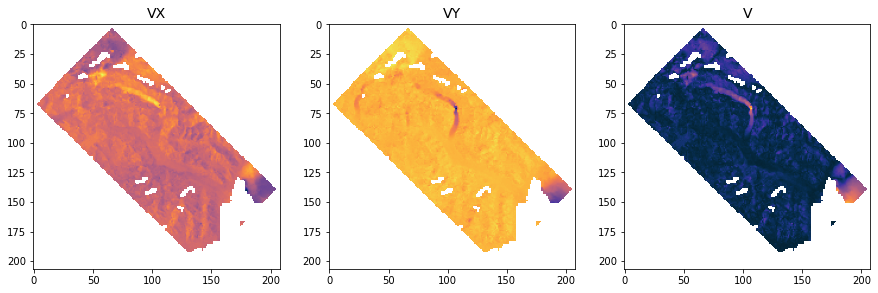

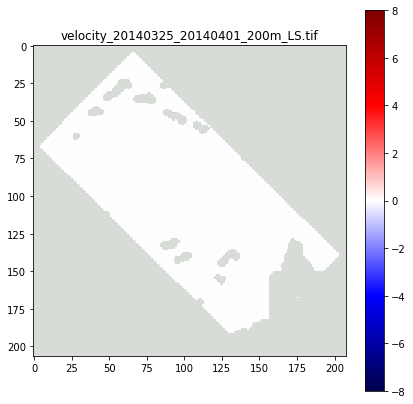

velocity_20200401_20200410_200m_LS.tif


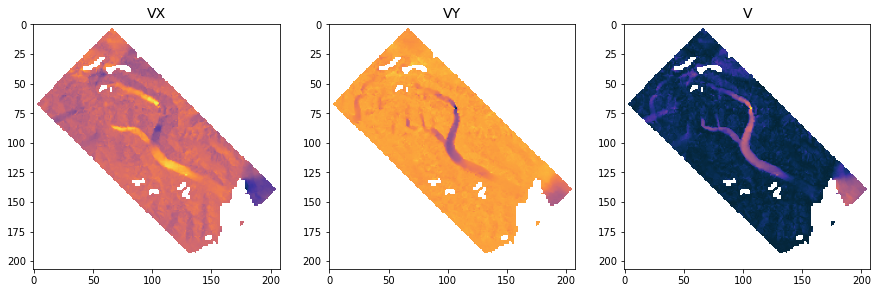

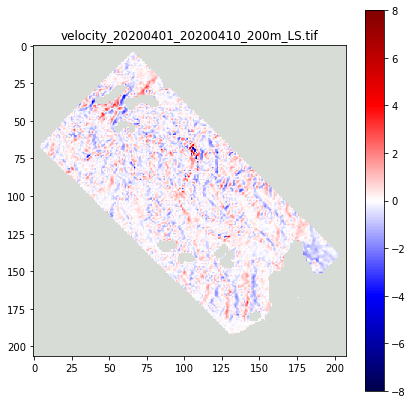

velocity_20220412_20220415_200m_S2.tif


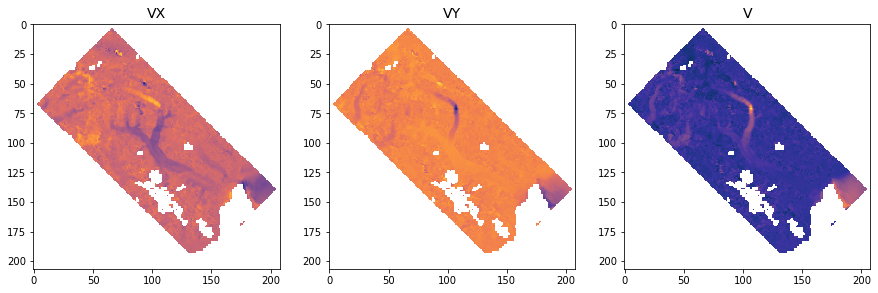

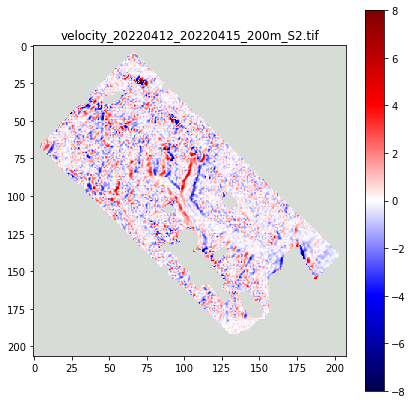

velocity_20220623_20220626_100m_S2.tif


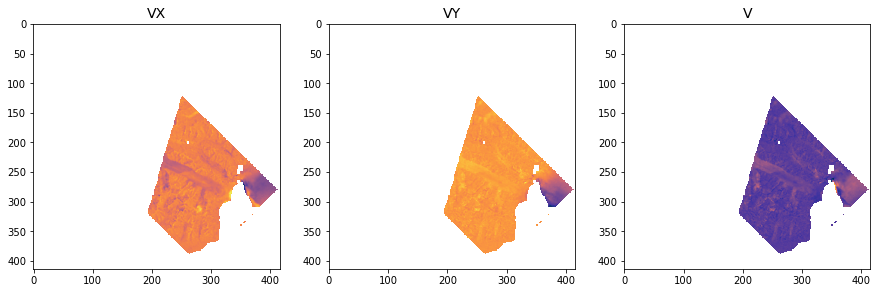

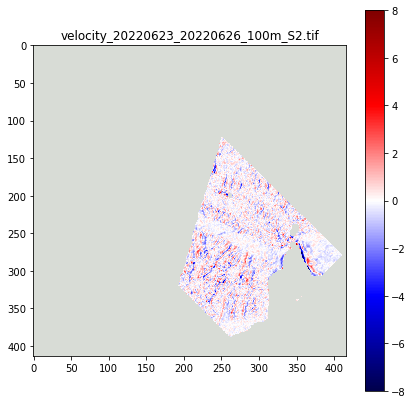

velocity_20180416_20180506_160m_S2.tif


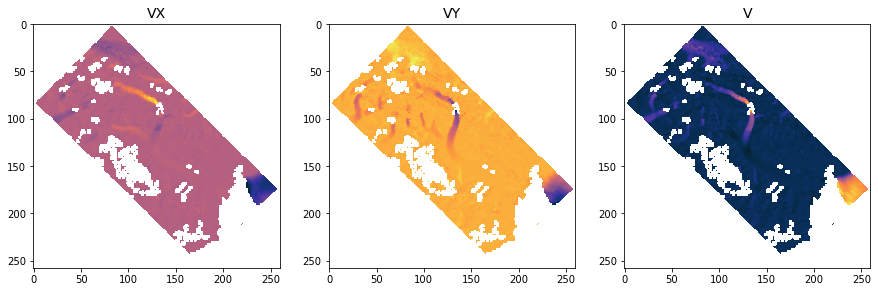

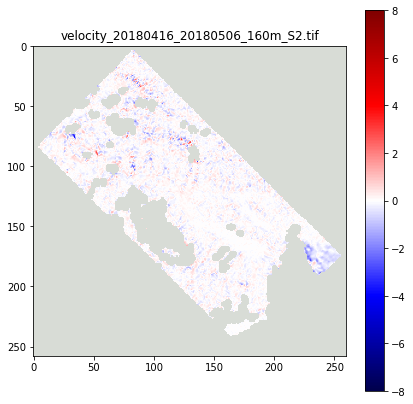

velocity_20190513_20190607_300m_S2.tif


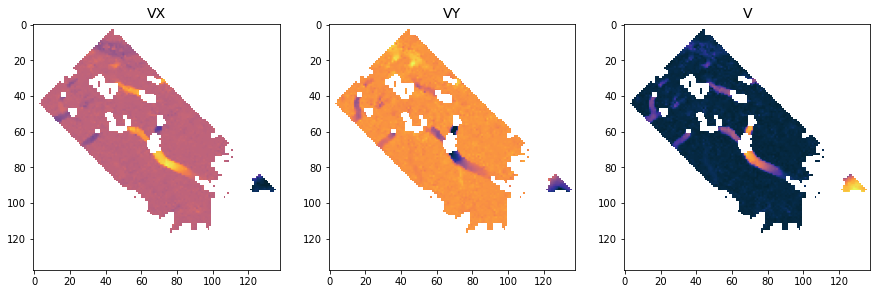

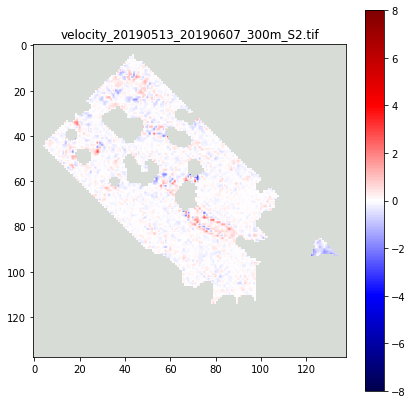

velocity_20180930_20181008_300m_S2.tif


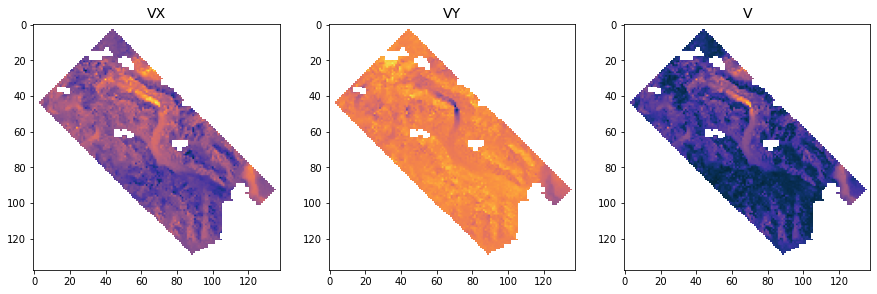

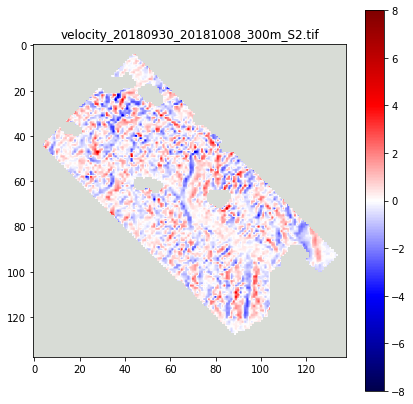

velocity_20210830_20210907_300m_S2.tif


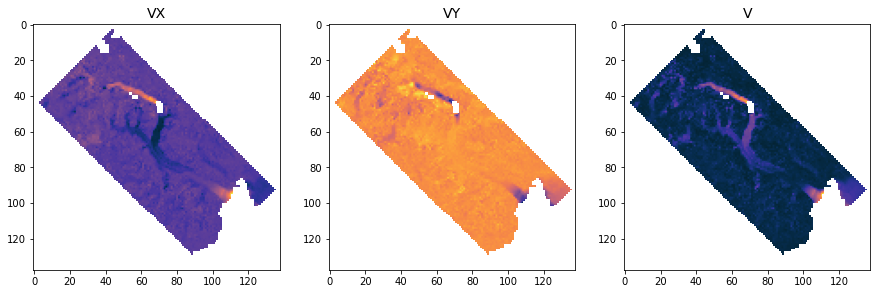

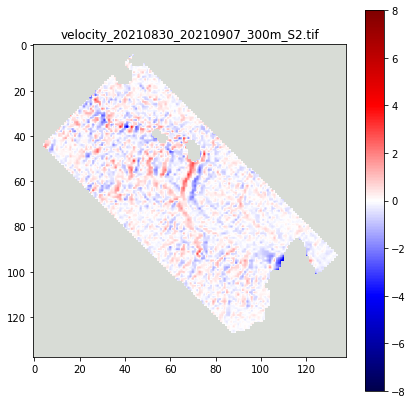

velocity_20220505_20220512_300m_S2.tif


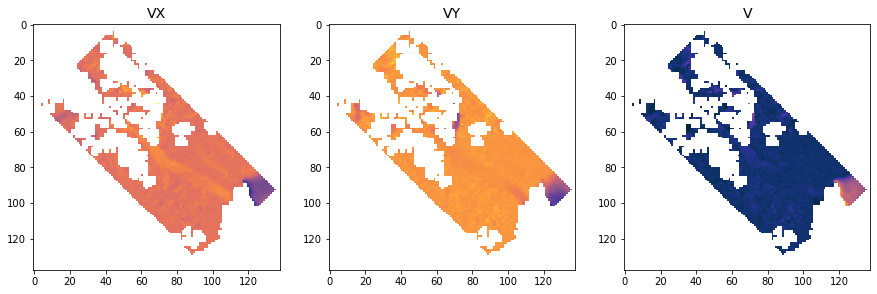

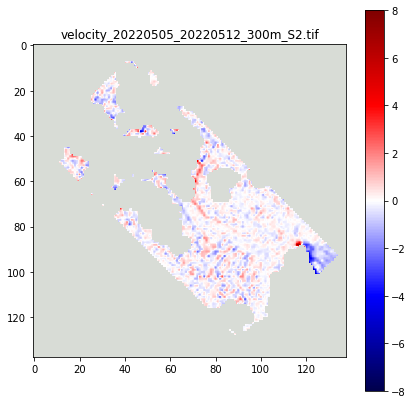

velocity_20220611_20220616_200m_S2.tif


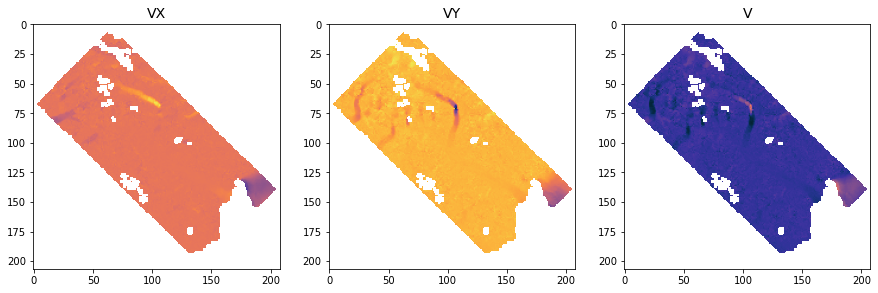

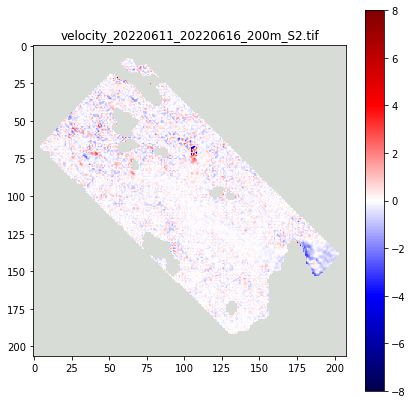

velocity_20210524_20210601_300m_S2.tif


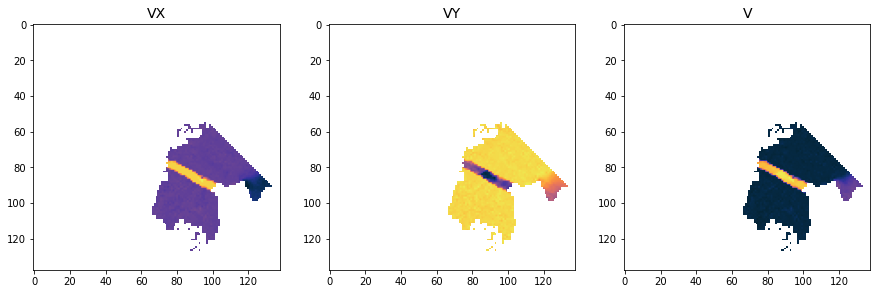

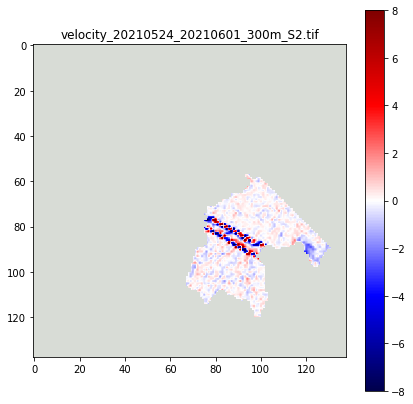

In [44]:
# grab the velocity filenames from the basepath
for file in os.listdir(basepath):
    if file.startswith('velocity') and file.endswith('.tif'):
        if file[9:26]+'_'+file.split('_')[4][:-4]+'_'+file.split('_')[3]+'.csv' in vmap_names:
            print(file)
            filename = file

            # open the velocity rasters using rasterio
            VFILE = rasterio.open(basepath+file, 'r')
            VX = VFILE.read(1)
            VY = VFILE.read(2)
            vmag = VFILE.read(3)

            # dsiplay to check
            fig, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(15,6))
            ax1.imshow(VX, cmap=cmocean.cm.thermal); ax1.set_title('VX', fontsize=14)
            ax2.imshow(VY, cmap=cmocean.cm.thermal); ax2.set_title('VY', fontsize=14)
            ax3.imshow(vmag, cmap=cmocean.cm.thermal); ax3.set_title('V', fontsize=14)
            plt.show()
            
            # Subset the velocity data using rasterio.mask.mask and subset polygon (must be in a [list] due to syntax of mask)
            subsetVFILE, transform1 = rasterio.mask.mask(VFILE, [subset], crop=True) 
            subsetVX_2D = subsetVFILE[0,:,:]
            subsetVY_2D = subsetVFILE[1,:,:]

            #CALCULATE FLOW DIRECTION AND SPEED
            Vdir = np.arctan2(subsetVY_2D, subsetVX_2D) #flow direction calculated using numpy's arctan2(y, x)
            Vdir_deg = Vdir*180/np.pi #converted to degrees
            V = np.sqrt(np.square(subsetVY_2D)+np.square(subsetVX_2D)) #calculate magnitude using the sqrt of the sum of square X and Y values

            #if magnitude is unrealistic, replace value with np.NaN value
            V[V > 2.5e9] = np.NaN; Vdir[V > 2.5e9] = np.NaN
            
            #grab x coordinate and y coordinate limits:
            #create vector of x coordinates and y coordinates (Greenland Polar Stereo) with the dimensions of the image
            #for plotting ticks
            Nticks = 3
            x_coords = np.linspace(subset.bounds[0], subset.bounds[2], num=Nticks, dtype=int); #print(x_coords)
            y_coords = np.linspace(np.max([subset.bounds[1], subset.bounds[3]]), np.min([subset.bounds[1], subset.bounds[3]]), num=Nticks, dtype=int)
            
            #set grid spacing y, which should be 250.0 m (print to check)
            dx = cellres; dy=cellres
            # Calculate dw/dz using mass continuity
            [dudy,dudx] = np.gradient(subsetVX_2D, dx); #gradients in x-component of velocity
            [dvdy,dvdx] = np.gradient(subsetVY_2D, -dy); #gradients in y-component of velocity
            dwdz = 0 - dudx - dvdy

            fig, ax = plt.subplots(figsize=(7,7))
            background_col='xkcd:light grey'
            ax.set_facecolor(background_col)
            im = ax.imshow(dwdz, vmin=-8, vmax=8,cmap='seismic')
            ax.set_title(file)
            fig.colorbar(im, ax=ax)
            plt.show()

            